# Introduction
Analysis of simulations relating to polymer models of chromatin

### Imports
Import libraries and write settings here.

In [227]:
# Notebooks specific imports
from IPython import get_ipython
ipython = get_ipython()
#Expand notebook display

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))
# Display all cell outputs
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'
# autoreload extension
if 'autoreload' not in ipython.extension_manager.loaded:
    %load_ext autoreload
%autoreload 2

# Basic useful imports
import re
import time
import yaml
from pprint import pprint
from pathlib import Path
import h5py

# Data manipulation
import numpy as np
from scipy.special import erf
from scipy.integrate import quad
import scipy.stats as stats

# Visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import (Circle, RegularPolygon, FancyArrowPatch, ArrowStyle)
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator, NullFormatter)
import matplotlib.colors as colors

# From AMSOS_analysis.py
import amsos_analysis as aa
from amsos_analysis.colormaps import register_cmaps

### Style settings

In [2]:
graph_sty = {
    "axes.titlesize": 20,
    "axes.labelsize": 24,
    "lines.linewidth": 2,
    "lines.markersize": 10,
    "xtick.labelsize": 24,
    "ytick.labelsize": 24,
    "font.size": 20,
    "font.sans-serif": 'Helvetica',
    "text.usetex": False,
    'mathtext.fontset': 'cm',
}
plt.style.use(graph_sty)
        

In [214]:
register_cmaps()
#plt.rcParams['image.cmap'] = 'emct8'
#plt.rcParams['image.cmap'] = 'warm'
plt.rcParams['image.cmap'] = 'YlOrRd'
#plt.rcParams['image.cmap'] = 'twilight'
#plt.rcParams['image.cmap'] = 'coolwarm'
#plt.rcParams['image.cmap'] = 'RdYlBu_r'

### Location

In [4]:
ws_path = Path('/home/alamson/DATA/Chromatin/')
mnt_path = Path.home() / 'projects/DATA/Chromatin/'
ceph_path = Path.home() / 'ceph/DATA/Chromatin/'

# Functions

## Physical scale calculations

In [6]:
def get_drag_coeff(bead_rad, viscosity):
    ''' Dimensions of Length/(Time*Force) = Length^2/(Time*Energy)'''
    return 6.*np.pi*viscosity*bead_rad

print(get_drag_coeff(.01, 1000))

188.4955592153876


In [7]:
def get_char_time(bead_diam, viscosity, kT=.00411):
    ''' Characteristic time i.e. the time it takes for bead to diffuse its diameter '''
    return 4.*np.pi*viscosity*np.power(bead_diam, 3)/kT

print(get_char_time(.01, 1000.)) # in sec

3.0575110983842273


In [8]:
def get_poly_diffuse_dist(time, n_beads, bead_diam, viscosity, frac_dim=.5, kT=.00411 ):
    return np.sqrt(kT*time/(np.pi*viscosity*bead_diam*np.power(n_beads, frac_dim)))

print(get_poly_diffuse_dist(100*3600, 512, .02, 1000.)) # In microns

1.0201516513282987


In [9]:
def get_rouse_time(n_beads, bead_diam, viscosity, kT=.00411 ):
    return 2.*viscosity*np.power(bead_diam,3)*n_beads*n_beads/(3*np.pi*kT)

print(get_rouse_time(512, .02, 1000.)/3600) # In hours

30.077688313513075


In [10]:
def get_link_relax_time(bead_rad, viscosity, spring_const):
    return (6.*np.pi*viscosity*bead_rad)/spring_const

print(get_link_relax_time(.01, 1000, 3650)) # in seconds

0.05164261896311989


In [11]:
def get_pfract(n_chrom, rad_chrom, n_crowd, rad_crowd, rad_sys, pcoeff=.75):
    return (n_chrom*(rad_chrom**3) + n_crowd*(rad_crowd**3))/(rad_sys**3 *.75) 

print(get_pfract(700, .01, 100000, .01, 1.05))

0.11598459489615955


## Radial distribution function

In [12]:
def rad_distr_func_avg(dist_mat, nbins=100, hist_max=.5, orig_density=1.):
    """TODO: Docstring for cylindrical histogram.
    @param pos_mat TODO
    @param nbins TODO
    @return: TODO
    """

    rad_distr_func, rad_bin_edges = np.histogram(
        dist_mat.flatten(), nbins, range=[
            0, hist_max], density=False)
    dr = rad_bin_edges[1:] - rad_bin_edges[:-1]
    rad = .5 * (rad_bin_edges[1:] + rad_bin_edges[:-1])
    rad_distr_func = rad_distr_func.astype(float)
    

    rad_distr_func /= 2. * np.pi * np.power(rad, 2) * dr * orig_density
    return (rad_distr_func, rad_bin_edges)

def make_rad_distr_func_graph(dist_mat, nbins=500, hist_max=.5, system_volume=1.0):
    fig, ax = plt.subplots(figsize=(8,6))
    nsteps = dist_mat.shape[-1]
    nbeads = dist_mat.shape[0]
    density = float(nbeads)/system_volume
    rad_distr_func, rad_bin_edges = rad_distr_func_avg(dist_mat, nbins, hist_max, orig_density=density)
    rad_distr_func /= nsteps
    rad = .5 * (rad_bin_edges[1:] + rad_bin_edges[:-1])
    ax.plot(rad[1:], rad_distr_func[1:])
    ax.set_yscale('log')
    ax.set_xlabel(r'Bead separation $r$ ($\mu$m)')
    ax.set_ylabel(r'Radial distribution function $g(r)$')
    
    return fig, ax, rad_distr_func, rad
 

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


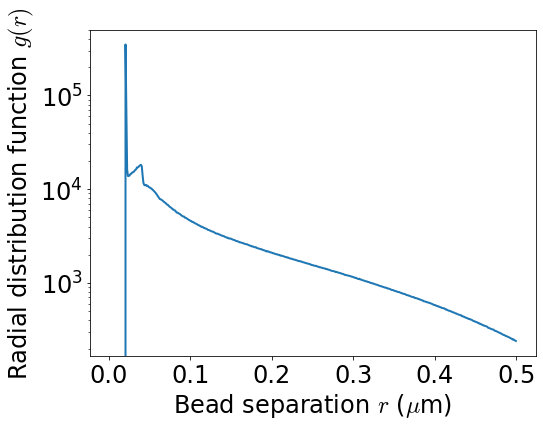

In [13]:
data_path = (ceph_path /"21-05-18_AMchr1_scan.8_loop520_pin/simulations/s2/")
ss_ind = 900
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[0, 520])
    vol = np.pi*(.5**3)/.75
    fig, ax, rad_distr_func, rad_arr = make_rad_distr_func_graph(dist_mat, system_volume=vol)

tmp1 = rad_distr_func[1:]
#plt.yscale("log")



# Test graphs

## Segment distribution

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


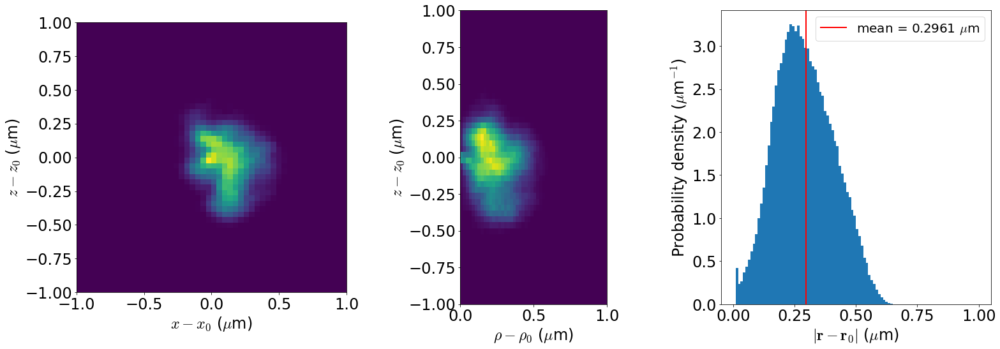

In [14]:
# Testing
data_path = ceph_path / "21-04-23_AMchr1_line512_pin/"
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    sy_dat = h5_data['raw_data']['sylinders'][...]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    _ = aa.make_segment_distr_graphs(com_arr, [], [0,1], 1,2)

## End-to-End Displacement

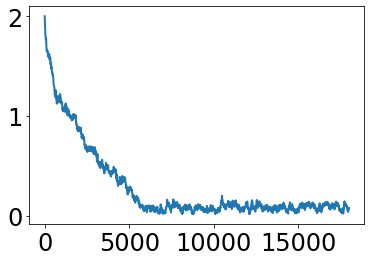

In [15]:
data_path = ceph_path / "21-05-07_AMchr1_line100_scan5.1_xl1000-5000/simulations/xl1000/"
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    ee_dist = aa.get_end_end_distance(com_arr)
    
fig, ax = plt.subplots()
_ = ax.plot(time_arr, ee_dist)

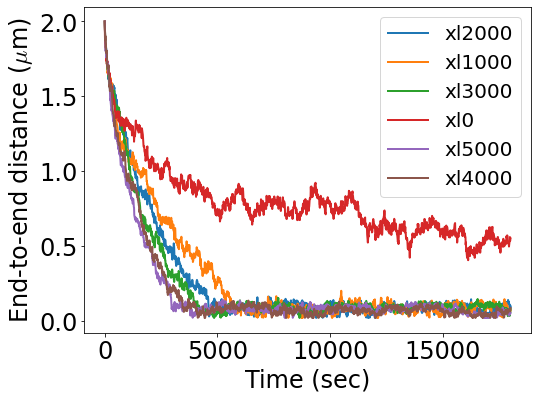

In [16]:
data_path = ceph_path / "21-05-07_AMchr1_line100_scan5.1_xl1000-5000/simulations/"
ss_ind = 0
fig, ax = plt.subplots(figsize=(8,6))
for h5_path in data_path.glob('**/*.h5'):
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        ee_dist = aa.get_end_end_distance(com_arr)
    
    _ = ax.plot(time_arr, ee_dist, label=h5_path.stem)
    
_ = ax.set_xlabel('Time (sec)')
_ = ax.set_ylabel('End-to-end distance ($\mu$m)')
_ = ax.legend()

## Radius of gyration

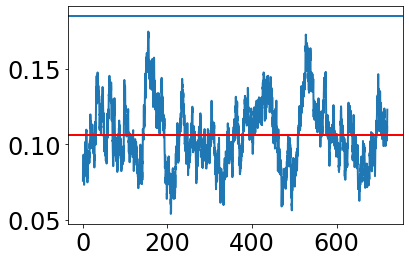

In [17]:
data_path = ceph_path / "21-05-12_AMchr1_RS_line512eq_lo0_kl36.50_visc1.0_ts.1/"

ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    rog_arr = aa.calc_rad_of_gyration(com_arr)
    ee_dist = aa.get_end_end_distance(com_arr)

fig, ax = plt.subplots()
_ = ax.plot(time_arr, rog_arr)
_ = ax.axhline(np.sqrt(nbeads*.02*.02/6.))
_ = ax.axhline(np.mean(rog_arr), c='r')
#ax.plot(time_arr, ee_dist)
#plt.axhline(np.mean(rog_arr))

## Nearest neighbors

[181 228 229 230]
[330 283 282 281]


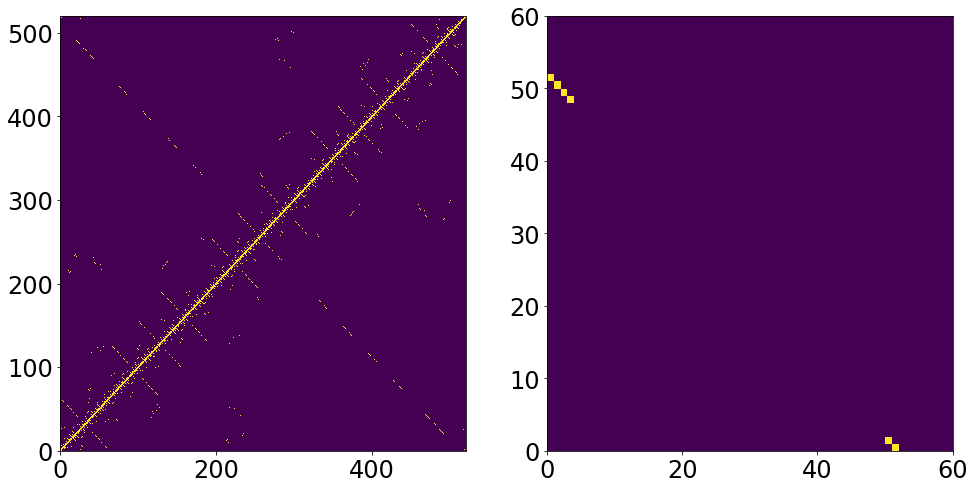

In [18]:
data_path = ceph_path / "21-04-06_AMchr1_loop520_pin_conf.6/"
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    sy_dat = h5_data['raw_data']['sylinders'][...]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    neighbor_mat = aa.find_neighbors(com_arr, .02)
    fig, ax = plt.subplots(1, 2, figsize=(16, 8))
    ax[0].pcolorfast(neighbor_mat)
    start=180
    stop=240
    ax[1].pcolorfast(neighbor_mat[start:stop, -stop:-start])
    x, y = np.where(neighbor_mat)
    x_ind = np.where((x > start) & (x < stop))
    print(x[x_ind][np.where(y[x_ind] > 520-stop)])
    print(y[x_ind][np.where(y[x_ind] > 520-stop)])
    #print(np.where(neighbor_mat))
    

# 700 bead looptails (aLENS)

## 21-08-11_aLchr1_looptail700

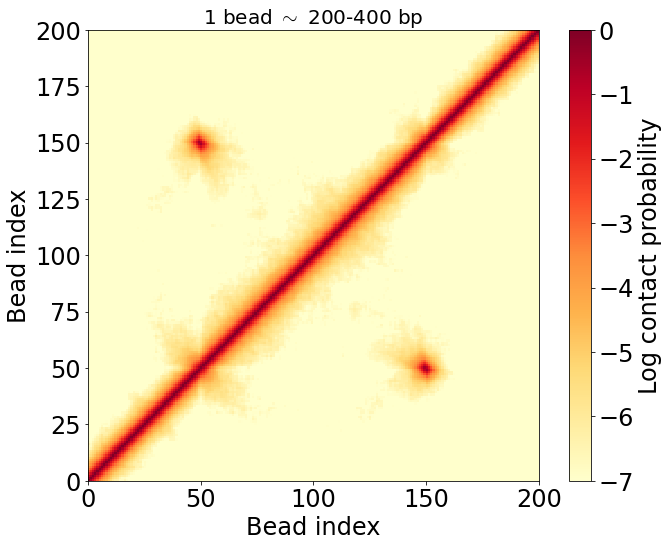

In [288]:
data_path = (ceph_path /"21-08-11_aLchr1_looptail700")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][250:450,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1.)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-11_aLchr1_looptail700_conf

2401


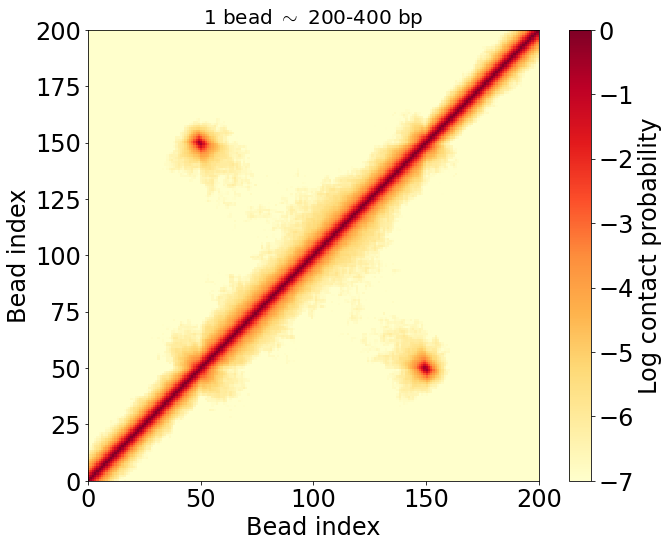

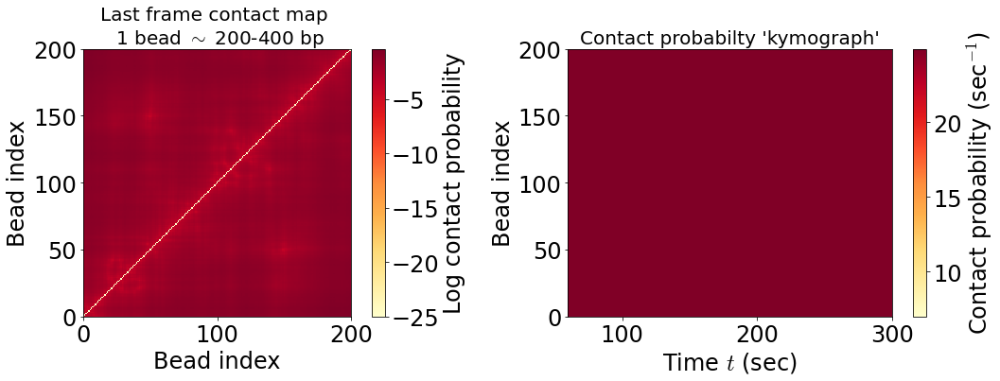

In [318]:
data_path = (ceph_path /"21-08-11_aLchr1_looptail700_conf")
ss_ind = 600
end_ind = -1
start_bead = 250
end_bead = 450
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)


contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7)

## 21-08-12_aLchr1_looptail700_rigid

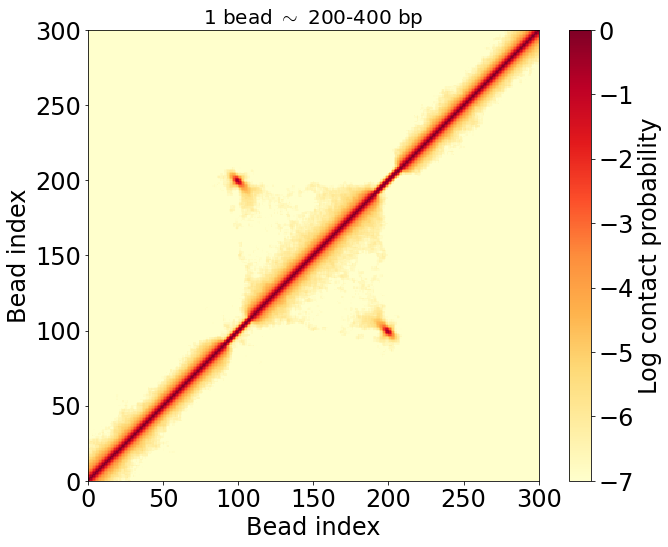

In [216]:
data_path = (ceph_path /"21-08-12_aLchr1_looptail700_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][200:500,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-13_aLchr1_2-1looptail700_fig4B

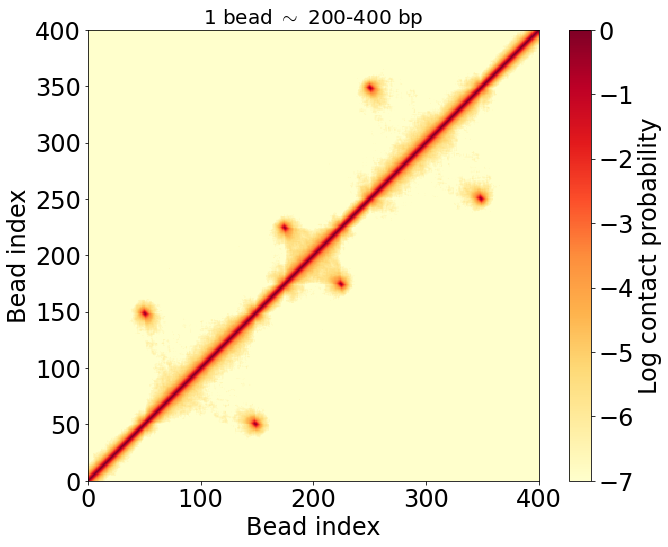

In [89]:
data_path = (ceph_path /"21-08-13_aLchr1_2-1looptail700_fig4B")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-13_aLchr1_2-1looptail700_fig4B_rigid1

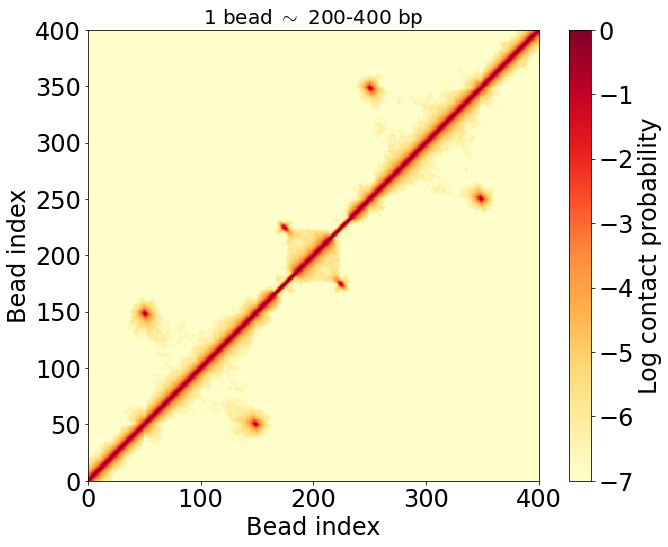

In [90]:
data_path = (ceph_path /"21-08-13_aLchr1_2-1looptail700_fig4B_rigid1")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-16_aLchr1_3looptail700

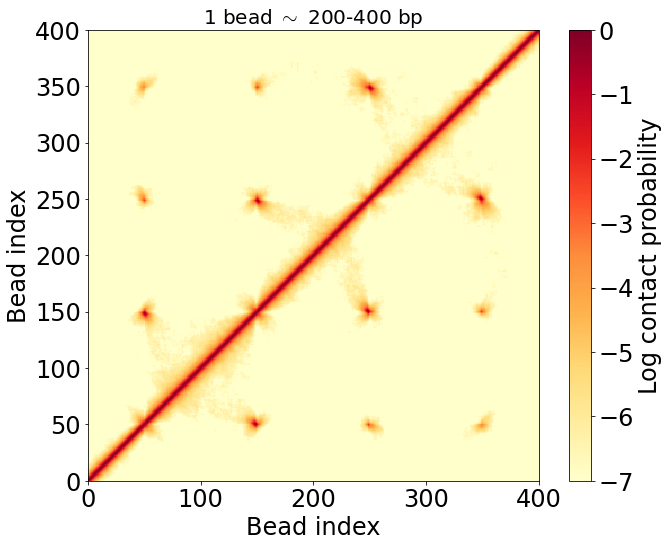

In [91]:
data_path = (ceph_path /"21-08-16_aLchr1_3looptail700")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-17_aLchr1_3looptail700_rigid

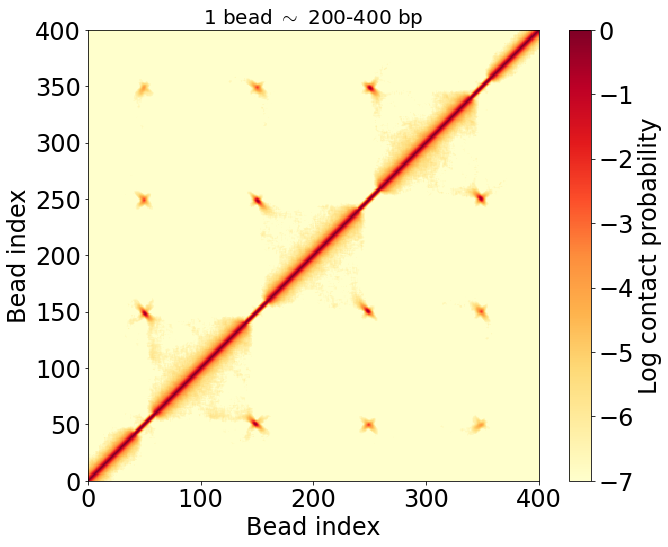

In [92]:
data_path = (ceph_path /"21-08-17_aLchr1_3looptail700_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-17_aLchr1_3Blooptail700

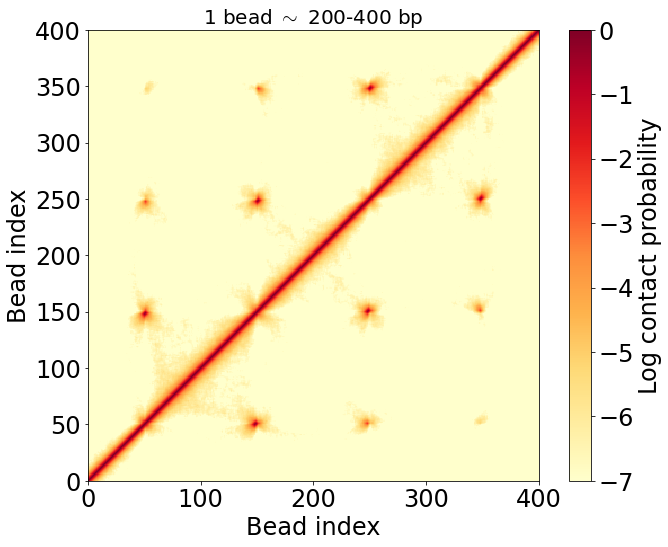

In [93]:
data_path = (ceph_path /"21-08-17_aLchr1_3Blooptail700")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)


#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-17_aLchr1_3Blooptail700_rigid

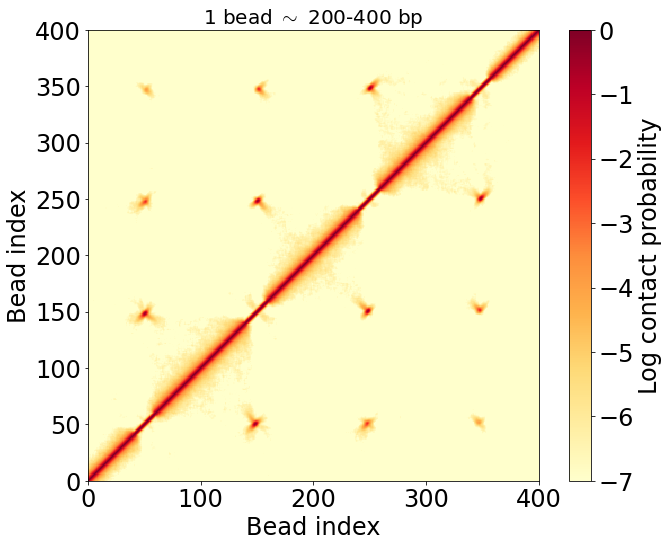

In [94]:
data_path = (ceph_path /"21-08-17_aLchr1_3Blooptail700_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-17_aLchr1_2looptail700

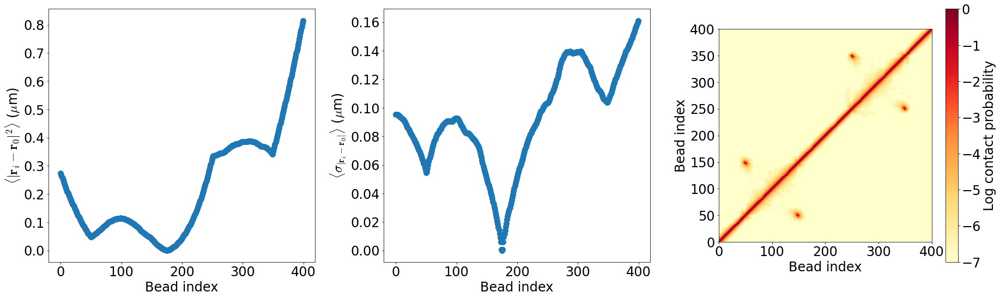

In [109]:
data_path = (ceph_path /"21-08-17_aLchr1_2looptail700")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=175, hist_max=1., vmin=-7)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-17_aLchr1_2looptail700_rigid

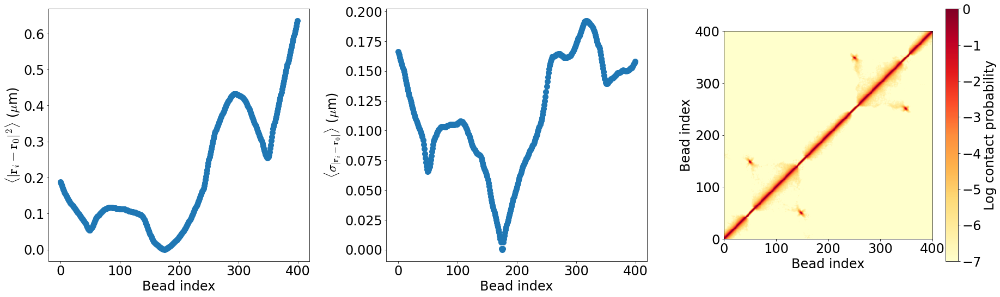

In [110]:
data_path = (ceph_path /"21-08-17_aLchr1_2looptail700_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=175, hist_max=1., vmin=-7)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-17_aLchr1_2Blooptail700

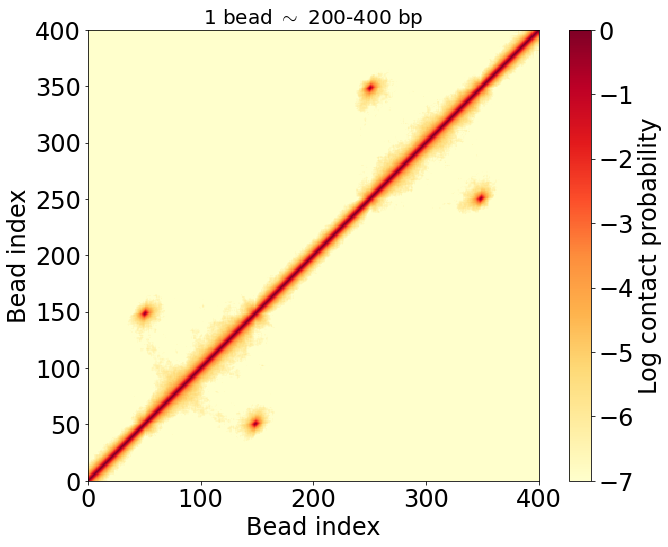

In [97]:
data_path = (ceph_path /"21-08-17_aLchr1_2Blooptail700")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-17_aLchr1_2Blooptail700_rigid

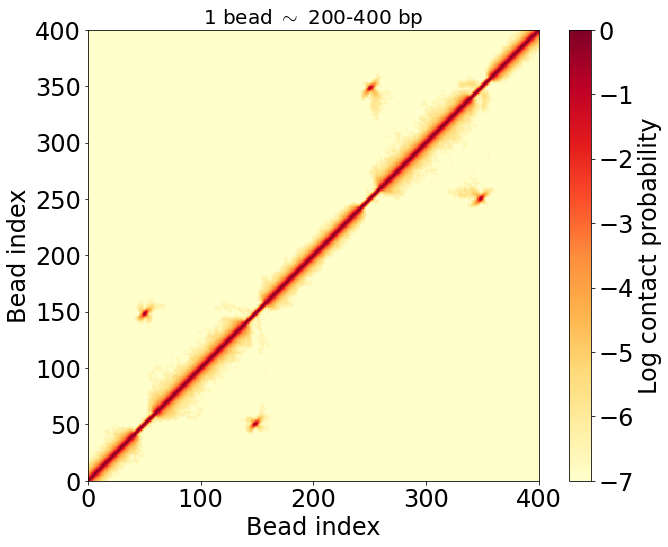

In [98]:
data_path = (ceph_path /"21-08-17_aLchr1_2Blooptail700_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-26_aLchr1_looptail700_hydro

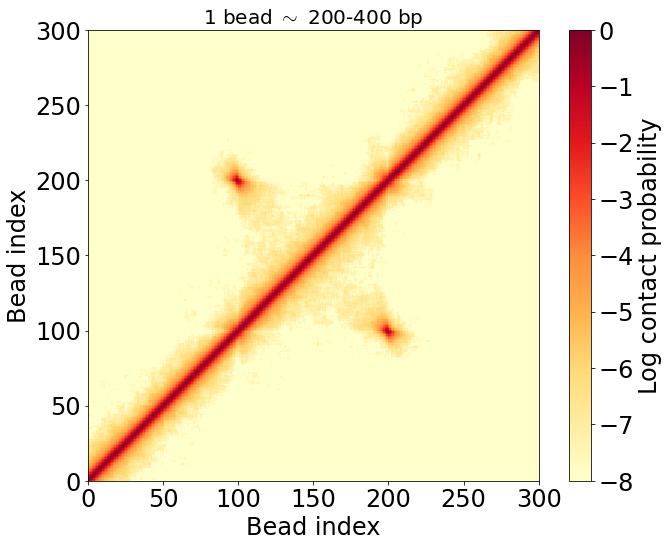

In [99]:
data_path = (ceph_path /"21-08-26_aLchr1_looptail700_hydro")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][200:500,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-8)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-01_aLchr1_looptail700_rigid_hydro

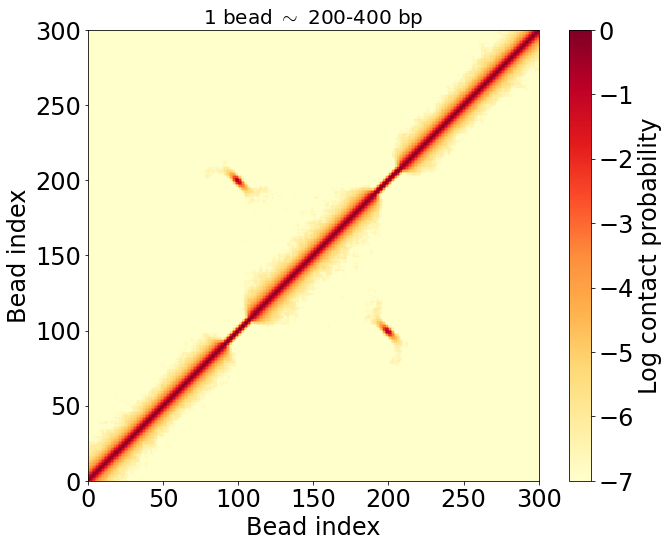

In [111]:
data_path = (ws_path /"21-09-01_aLchr1_looptail700_rigid_hydro")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][200:500,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-08_aLchr1_Dlooptail700_rigid

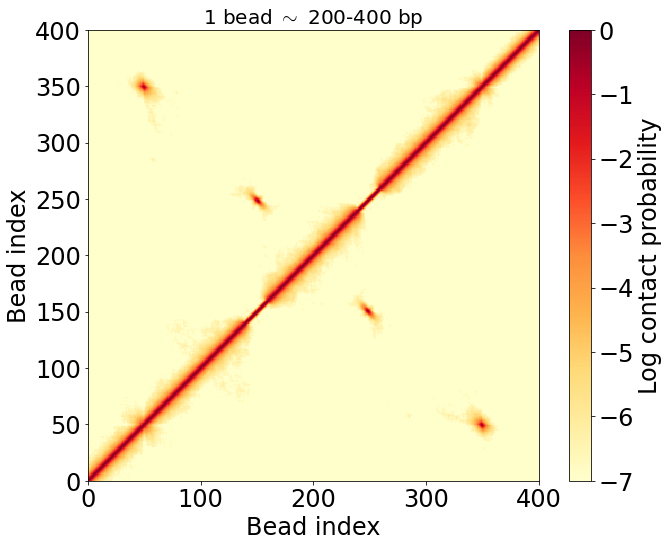

In [112]:
data_path = (ws_path /"21-09-08_aLchr1_Dlooptail700_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-09_aLchr1_Dlooptail700

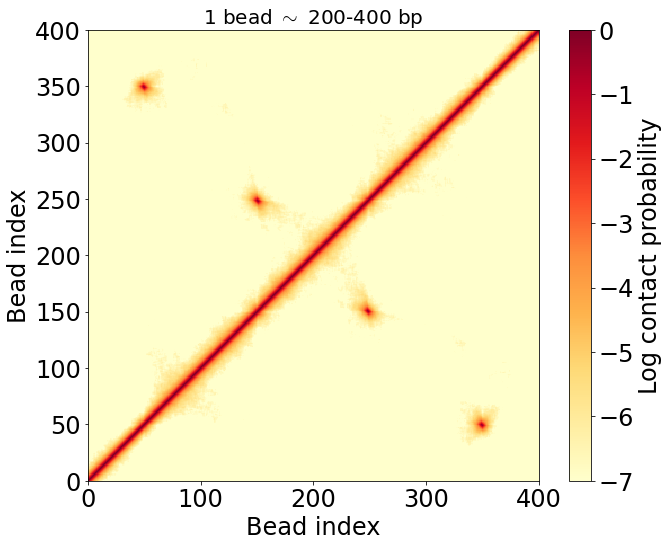

In [113]:
data_path = (ws_path /"21-09-09_aLchr1_Dlooptail700")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-09_aLchr1_Dlooptail700_conf

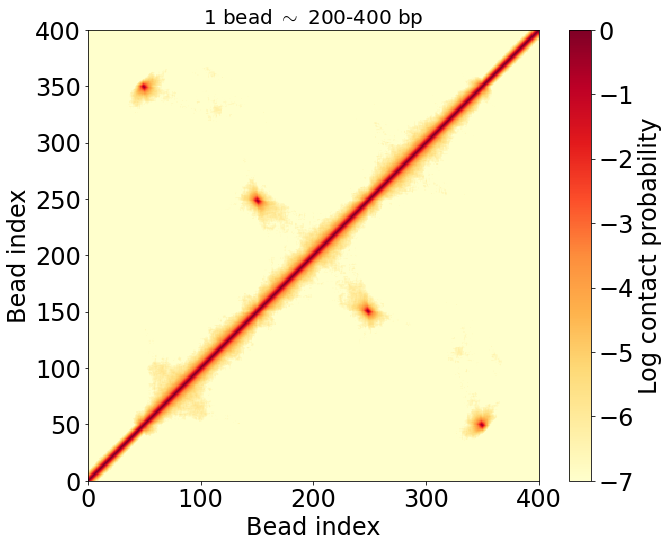

In [114]:
data_path = (ws_path /"21-09-09_aLchr1_Dlooptail700_conf")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-09_aLchr1_Dlooptail700_hydro

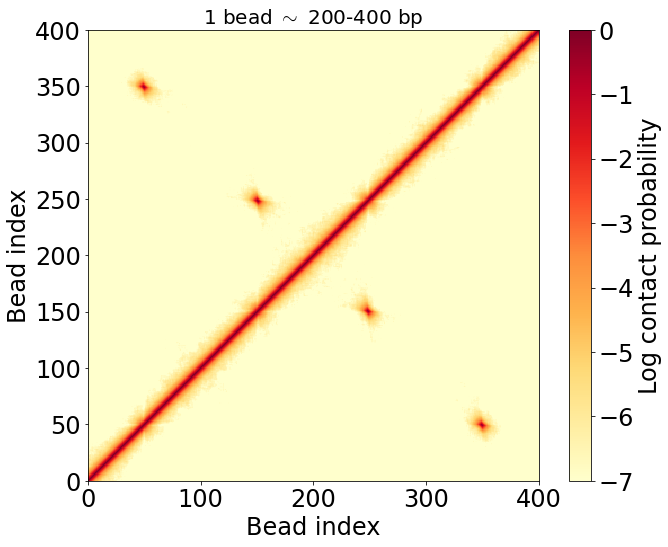

In [115]:
data_path = (ws_path /"21-09-09_aLchr1_Dlooptail700_hydro")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-09_aLchr1_Dlooptail700_rigid_conf

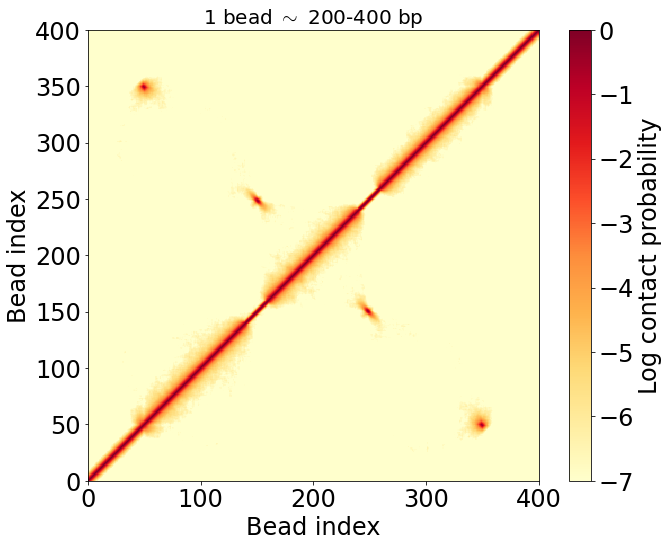

In [116]:
data_path = (ws_path /"21-09-09_aLchr1_Dlooptail700_rigid_conf")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-09_aLchr1_Dlooptail700_rigid_hydro

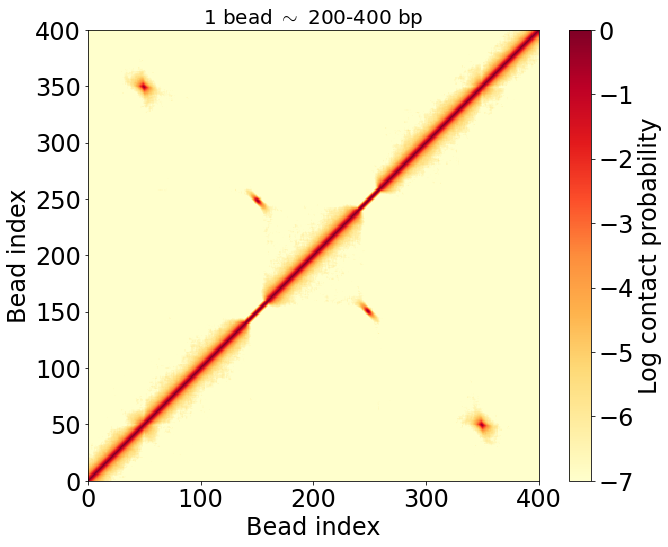

In [117]:
data_path = (ws_path /"21-09-09_aLchr1_Dlooptail700_rigid_hydro")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-09_aLchr1_line700_sticky_conf (Need to fix bug)

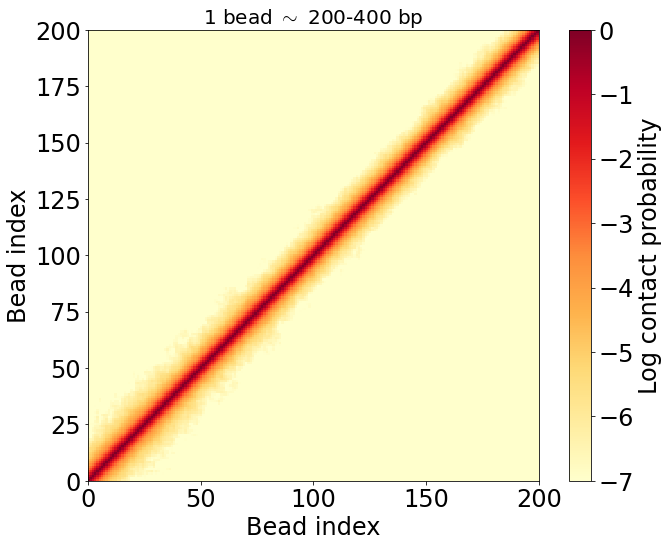

In [107]:
data_path = (ws_path /"21-09-09_aLchr1_line700_sticky_conf")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:350,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-09_aLchr1_LEF700eq_conf_rigid

600


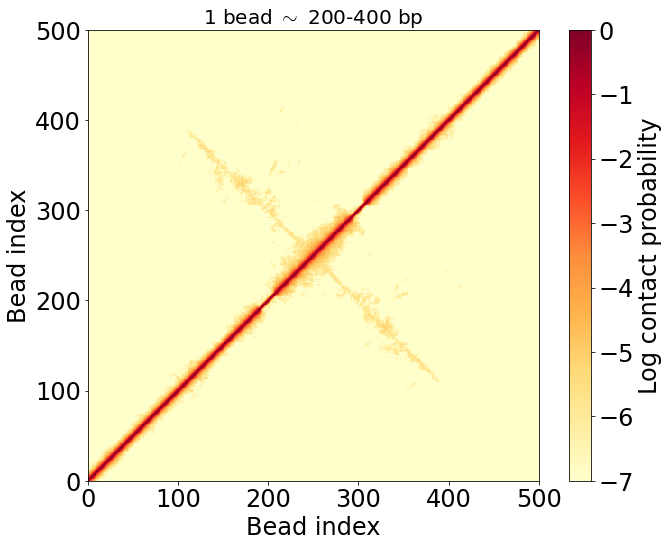

In [218]:
data_path = (ws_path /"21-09-09_aLchr1_slow_LEF700eq_conf_rigid")
ss_ind = 0
end_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][100:600,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-09_aLchr1_slow_LEF700eq_conf_rigid

600


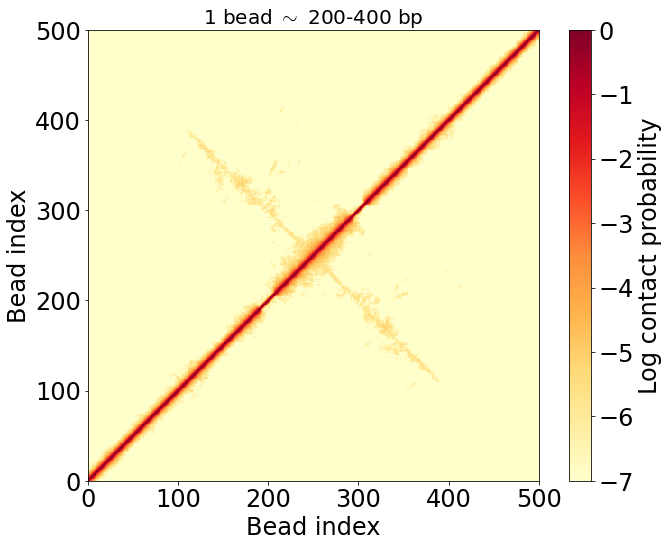

In [217]:
data_path = (ws_path /"21-09-09_aLchr1_slow_LEF700eq_conf_rigid")
ss_ind = 0
end_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][100:600,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-15_aLchr1_looptail700_ABasym_rigid

2401


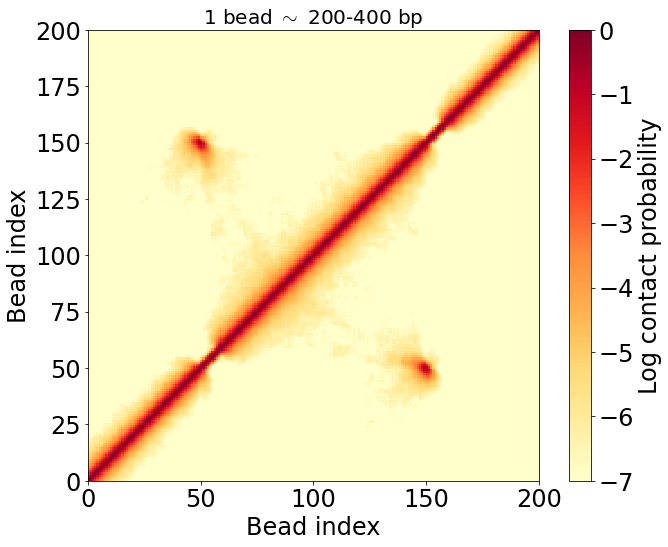

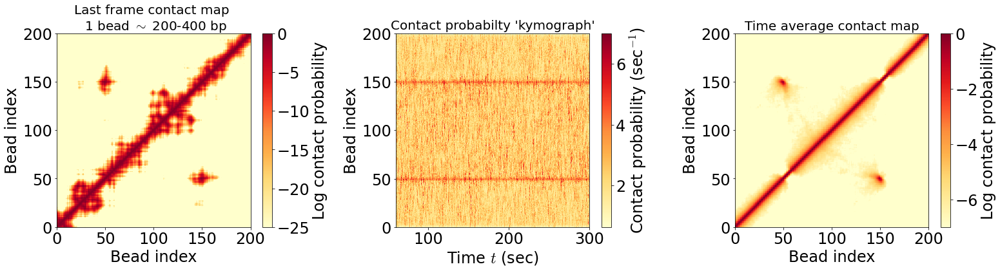

In [294]:
data_path = (ws_path /"21-09-15_aLchr1_looptail700_ABasym_rigid")
ss_ind = 600
end_ind = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][250:450,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)
#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-15_aLchr1_looptail700_BAasym_rigid

2401


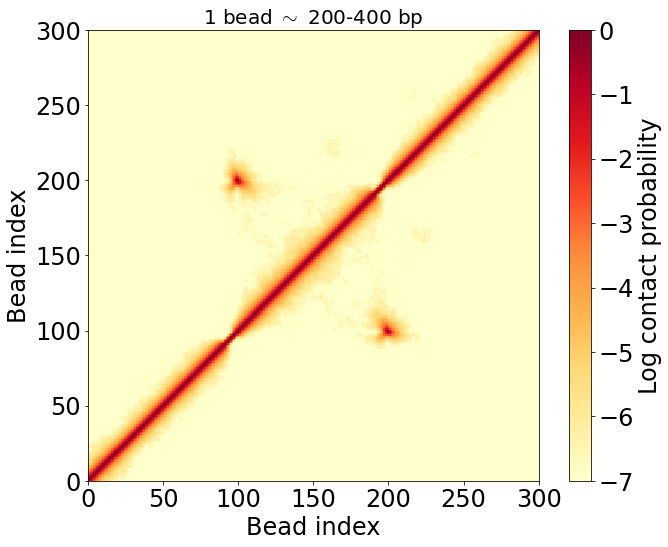

In [121]:
data_path = (ws_path /"21-09-15_aLchr1_looptail700_BAasym_rigid")
ss_ind = 600
end_ind = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][200:500,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-15_aLchr1_looptail700_Lasym_rigid

2401


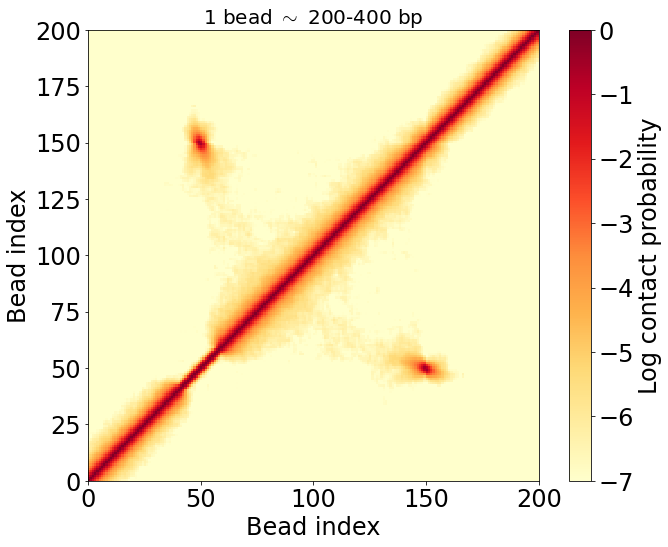

In [290]:
data_path = (ws_path /"21-09-15_aLchr1_looptail700_Lasym_rigid")
ss_ind = 600
end_ind = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][250:450,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-16_aLchr1_looptail700_AAasym_rigid

2401


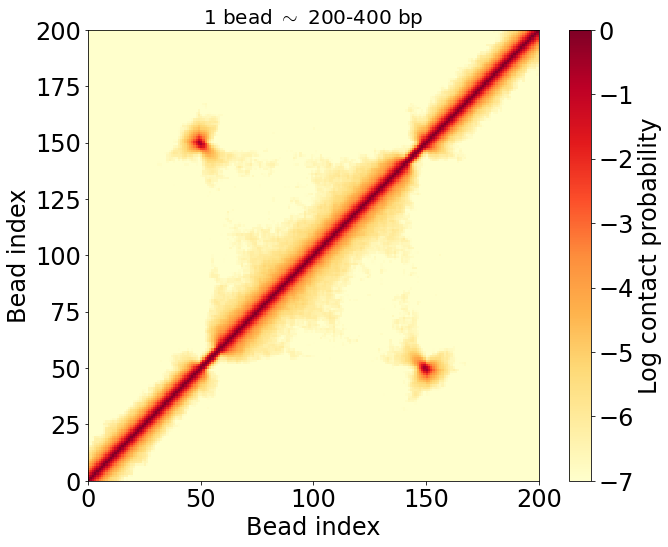

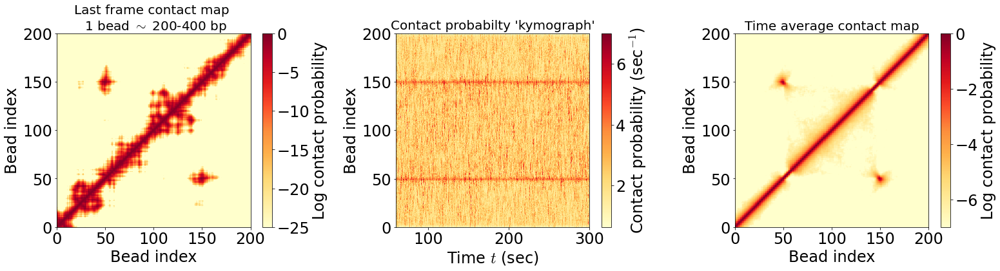

In [291]:
data_path = (ws_path /"21-09-16_aLchr1_looptail700_AAasym_rigid")
ss_ind = 600
end_ind = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][250:450,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-09-16_aLchr1_looptail700_BBasym_rigid

2401


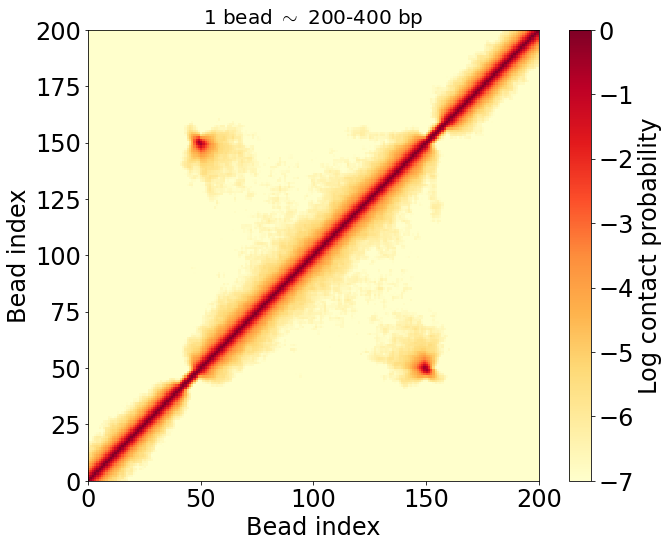

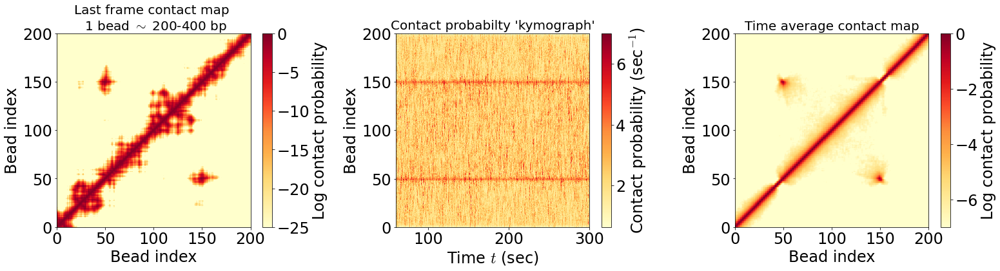

In [292]:
data_path = (ws_path /"21-09-16_aLchr1_looptail700_BBasym_rigid")
ss_ind = 600
end_ind = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][250:450,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-09-27_aLchr1_line700eq_500xl_conf

2401


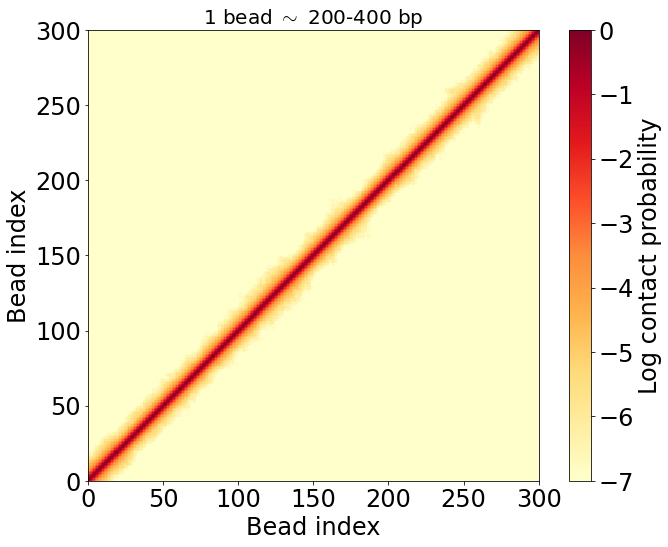

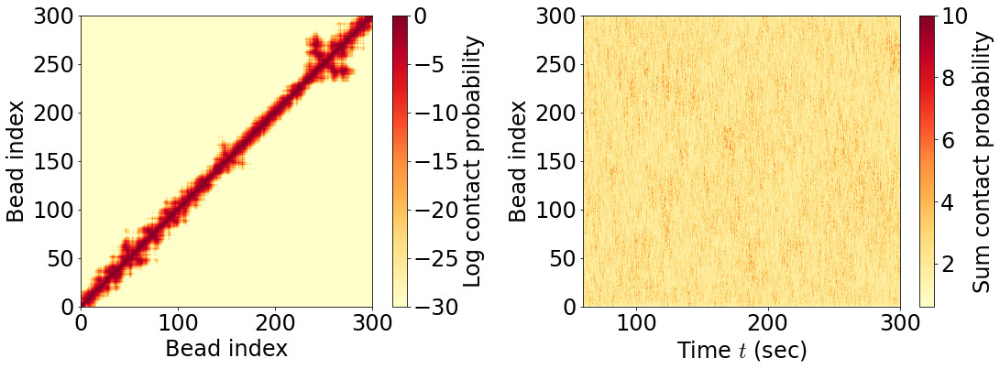

In [125]:
data_path = (ws_path /"21-09-27_aLchr1_line700eq_500xl_conf")
ss_ind = 600
end_ind = -1
start_bead = 200
end_bead = 500
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)


contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:-1], time_arr)

## 21-09-27_aLchr1_line700_sticky

3001


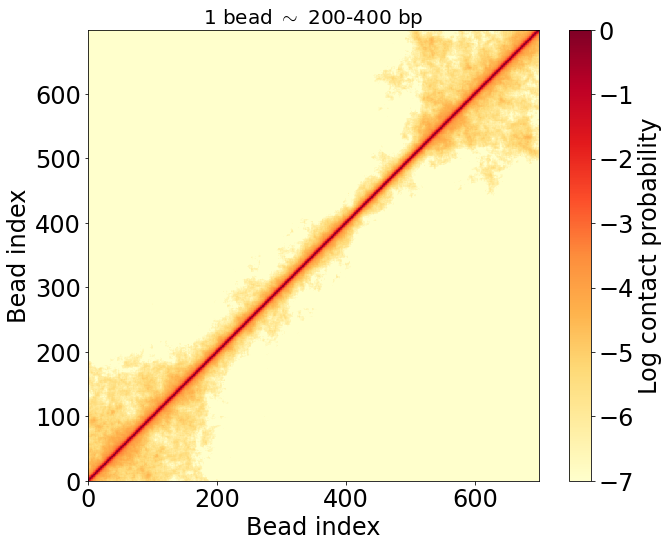

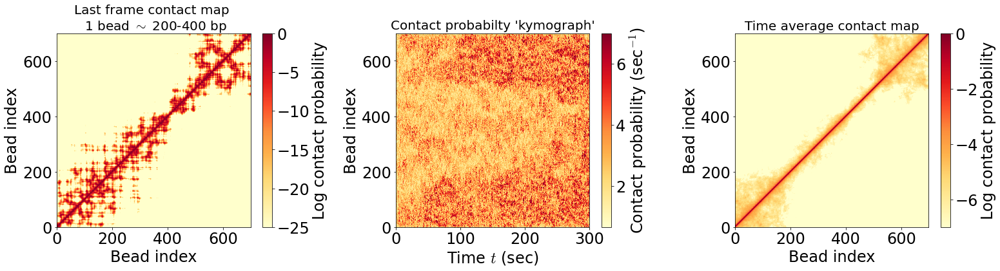

In [275]:
data_path = (ws_path /"21-09-27_aLchr1_line700_sticky")
ss_ind = 0
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)


contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)



## 21-09-30_aLchr1_line700_sticky_conf

3001


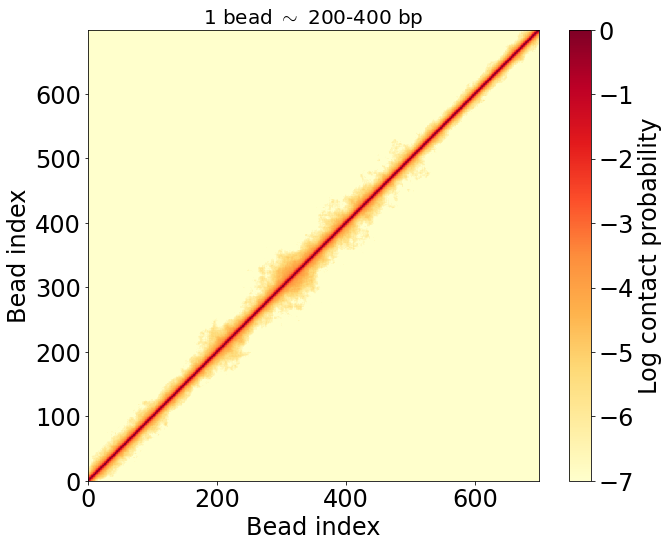

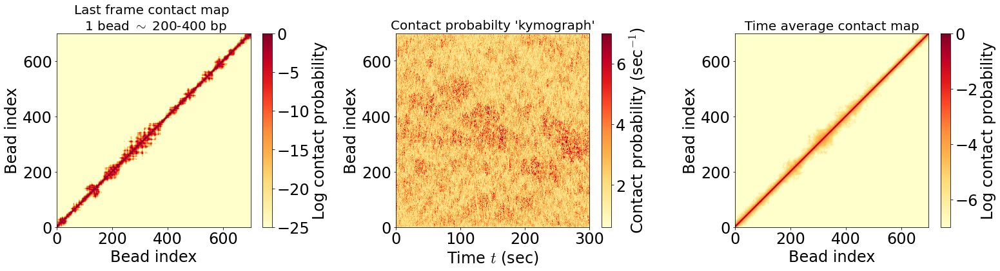

In [317]:
data_path = (ws_path /"21-09-30_aLchr1_line700_sticky_conf")
ss_ind = 0
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)


contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-09-30_aLchr1_line700_sticky_conf_rigid

3001


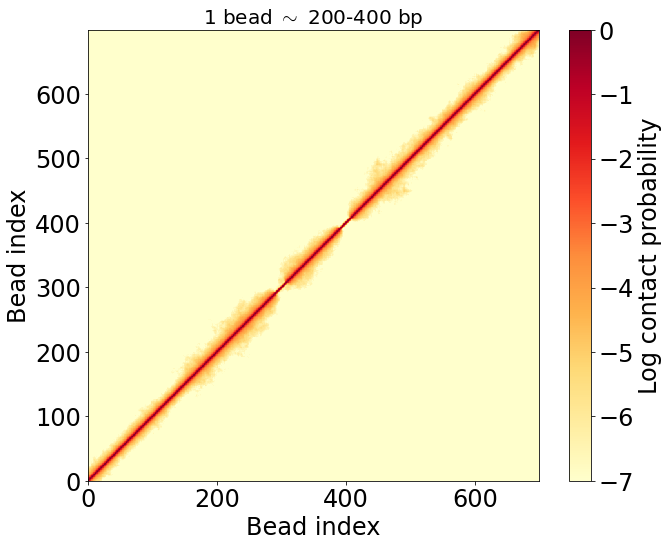

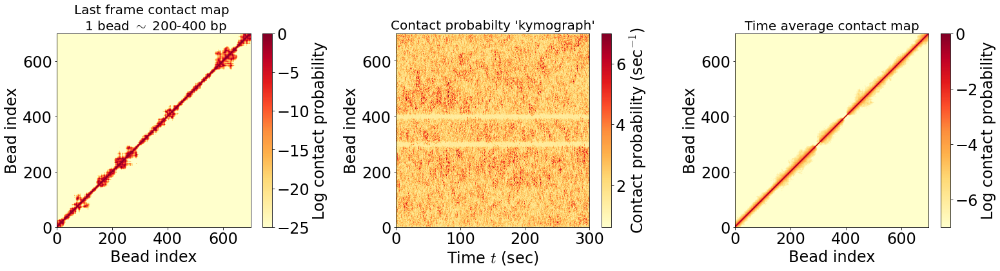

In [272]:
data_path = (ws_path /"21-09-30_aLchr1_line700_sticky_conf_rigid")
ss_ind = 0
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)


contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-09-30_aLchr1_looptail700_sticky_conf

3001


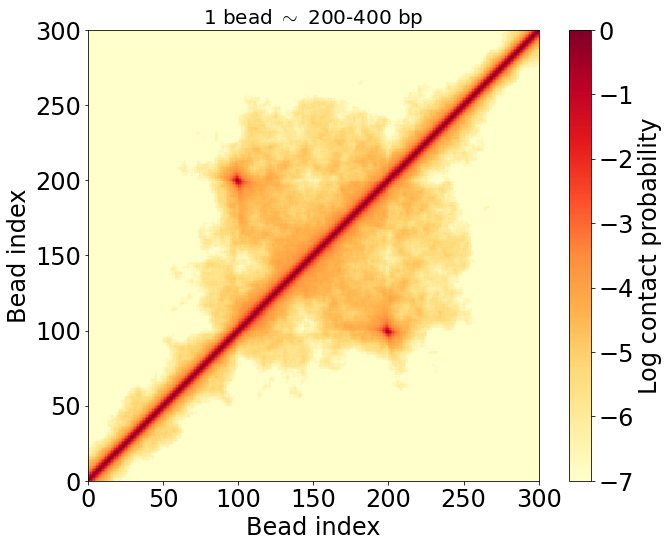

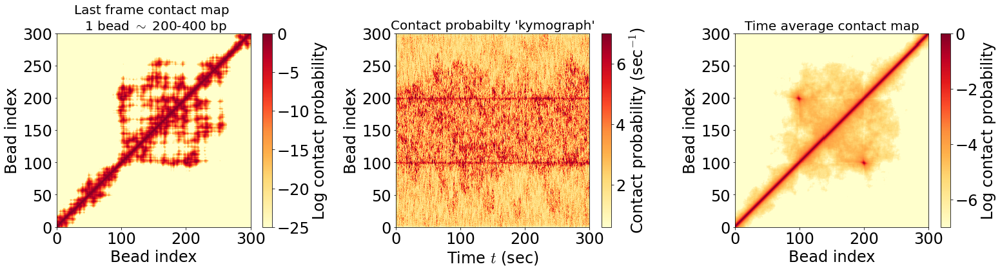

In [280]:
data_path = (ws_path /"21-09-30_aLchr1_looptail700_sticky_conf")
ss_ind = 0
end_ind = -1
start_bead = 200
end_bead = 500
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)


contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-09-30_aLchr1_looptail700_stickyloop_conf

3001


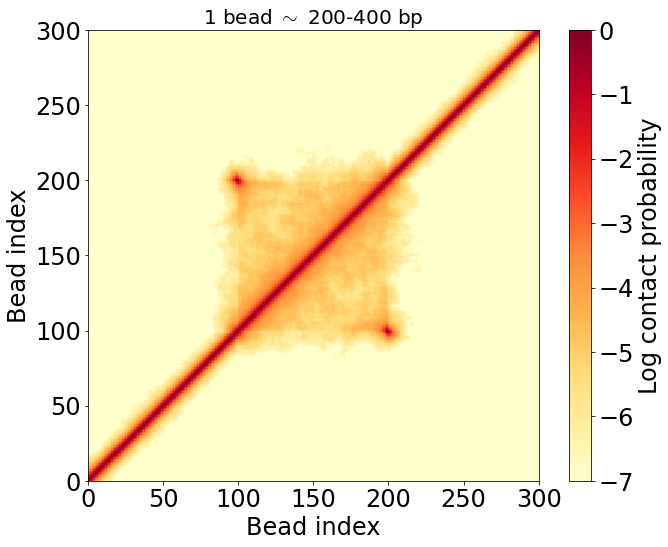

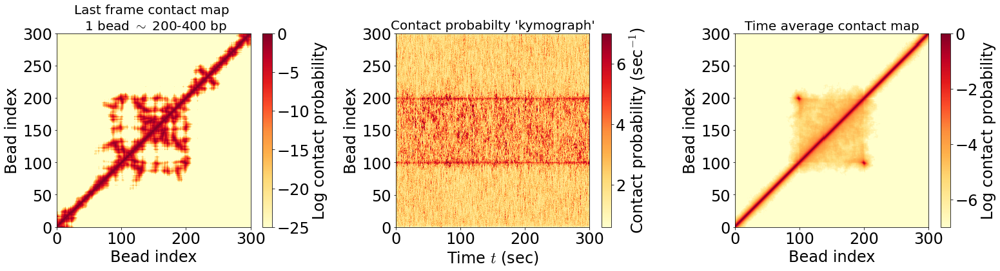

In [279]:
data_path = (ws_path /"21-09-30_aLchr1_looptail700_stickyloop_conf")
ss_ind = 0
end_ind = -1
start_bead = 200
end_bead = 500
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)


contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-09-30_aLchr1_looptail700_sticky40_conf

3001


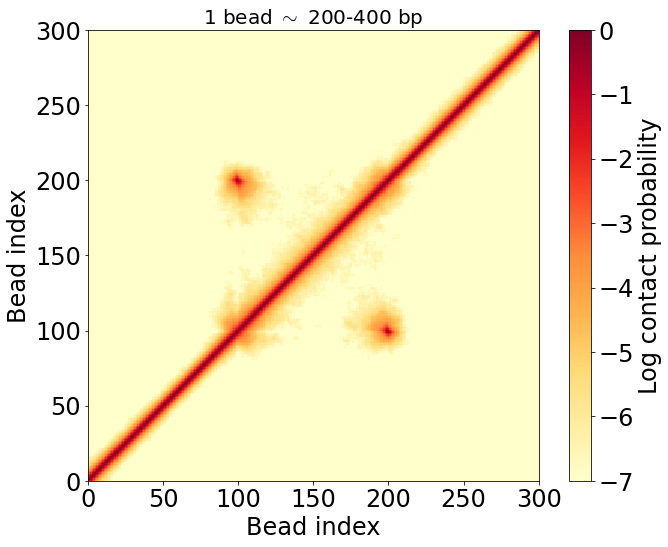

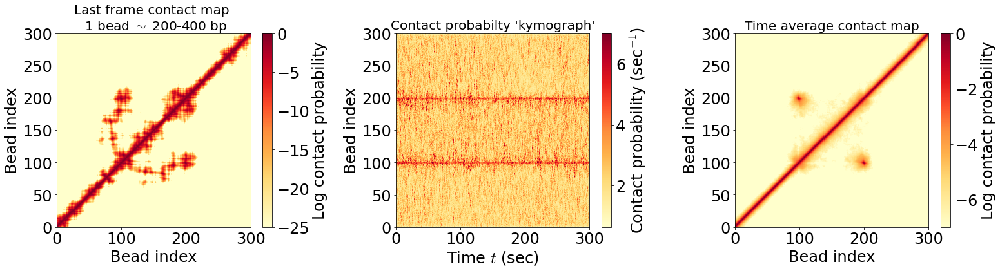

In [313]:
data_path = (ws_path /"21-09-30_aLchr1_looptail700_sticky40_conf")
ss_ind = 0
end_ind = -1
start_bead = 200
end_bead = 500
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)


contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-10-05_aLchr1_line700_stickyloop_conf

2401


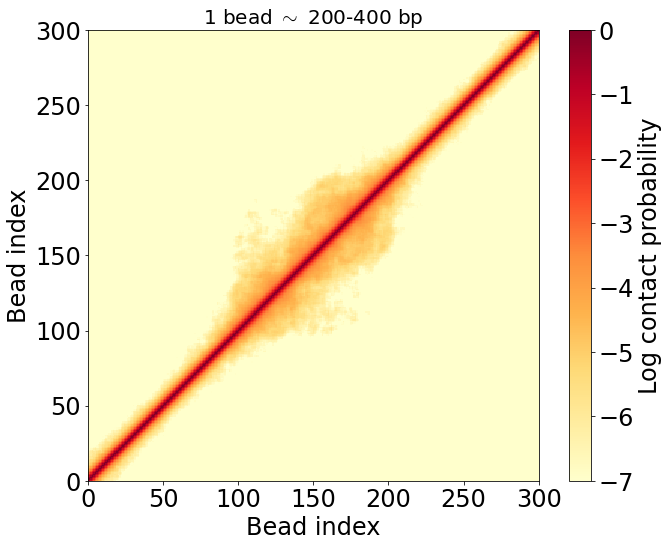

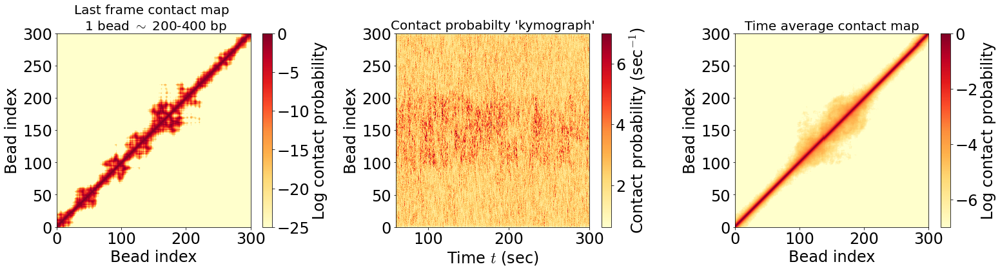

In [312]:
data_path = (ws_path /"21-10-05_aLchr1_line700_stickyloop_conf")
ss_ind = 600
end_ind = -1
start_bead = 200
end_bead = 500
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)


contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-10-06_aLchr1_line700_stickyloop_hydro_conf

In [311]:
h5_baseline = next((ws_path /"21-10-05_aLchr1_line700_stickyloop_conf").glob('*.h5'))
h5_comp = next((ws_path /"21-10-06_aLchr1_line700_stickyloop_hydro_conf").glob('*.h5'))

ss_ind = 600
end_ind = -1
start_bead = 0
end_bead = -1

with h5py.File(h5_baseline, 'r+') as h5_data:
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])
    contact_prob_bl = aa.gauss_weighted_contact(sep_dist_mat)


with h5py.File(h5_comp, 'r+') as h5_data:
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])
    contact_prob_comp = aa.gauss_weighted_contact(sep_dist_mat)
    
log_avg_cmat_diff = np.ma.masked_invalid(np.log((contact_prob_comp-contact_prob_bl).mean(axis=-1)))
log_avg_cmat_mdiff = np.ma.masked_invalid(np.log(contact_prob_comp.mean(axis=-1)-contact_prob_bl.mean(axis=-1)))




/tmp/ipykernel_2148780/77011354.py:20: RuntimeWarning: divide by zero encountered in log
  log_avg_cmat_diff = np.ma.masked_invalid(np.log((contact_prob_comp-contact_prob_bl).mean(axis=-1)))
/tmp/ipykernel_2148780/77011354.py:20: RuntimeWarning: invalid value encountered in log
  log_avg_cmat_diff = np.ma.masked_invalid(np.log((contact_prob_comp-contact_prob_bl).mean(axis=-1)))
/tmp/ipykernel_2148780/77011354.py:21: RuntimeWarning: divide by zero encountered in log
  log_avg_cmat_mdiff = np.ma.masked_invalid(np.log(contact_prob_comp.mean(axis=-1)-contact_prob_bl.mean(axis=-1)))
/tmp/ipykernel_2148780/77011354.py:21: RuntimeWarning: invalid value encountered in log
  log_avg_cmat_mdiff = np.ma.masked_invalid(np.log(contact_prob_comp.mean(axis=-1)-contact_prob_bl.mean(axis=-1)))


/tmp/ipykernel_2148780/3668327071.py:1: RuntimeWarning: divide by zero encountered in log
  log_avg_cmat_div = np.ma.masked_invalid(np.log((contact_prob_comp).mean(axis=-1))/np.log((contact_prob_bl.mean(axis=-1))))
/tmp/ipykernel_2148780/3668327071.py:1: RuntimeWarning: invalid value encountered in true_divide
  log_avg_cmat_div = np.ma.masked_invalid(np.log((contact_prob_comp).mean(axis=-1))/np.log((contact_prob_bl.mean(axis=-1))))


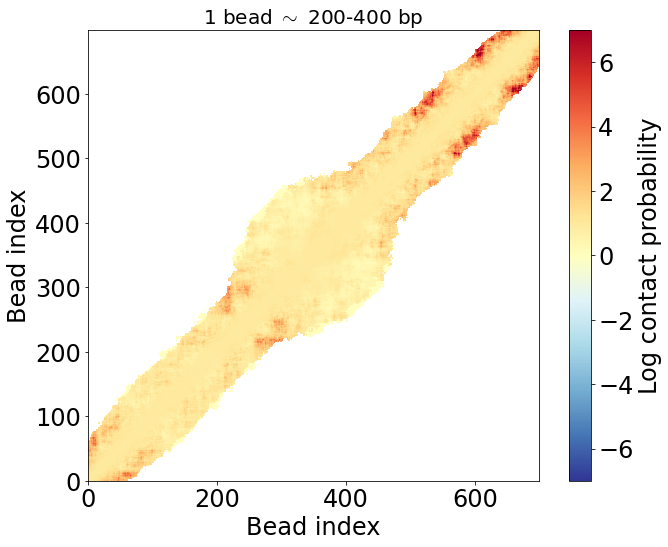

In [212]:
log_avg_cmat_div = np.ma.masked_invalid(np.log((contact_prob_comp).mean(axis=-1))/np.log((contact_prob_bl.mean(axis=-1))))
fig1, ax1 = aa.make_hic_plot(com_arr, log_avg_cmat_div, vmax=7, vmin=-7)

2401


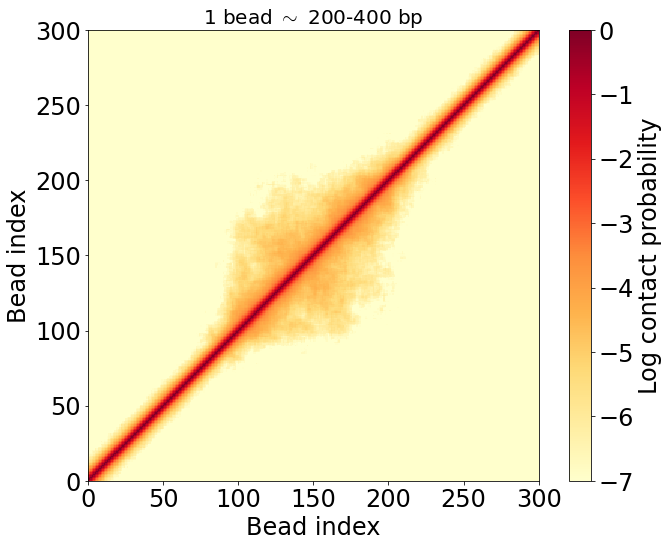

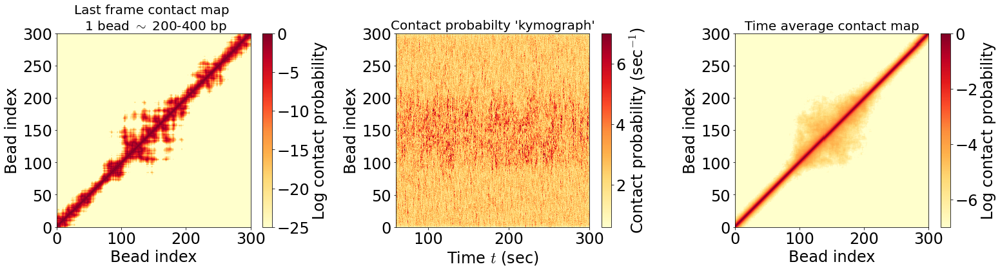

In [310]:
data_path = (ws_path /"21-10-06_aLchr1_line700_stickyloop_hydro_conf")
ss_ind = 600
end_ind = -1
start_bead = 200
end_bead = 500
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)

contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-10-07_aLchr1_looptail700_looprigid_conf

2401


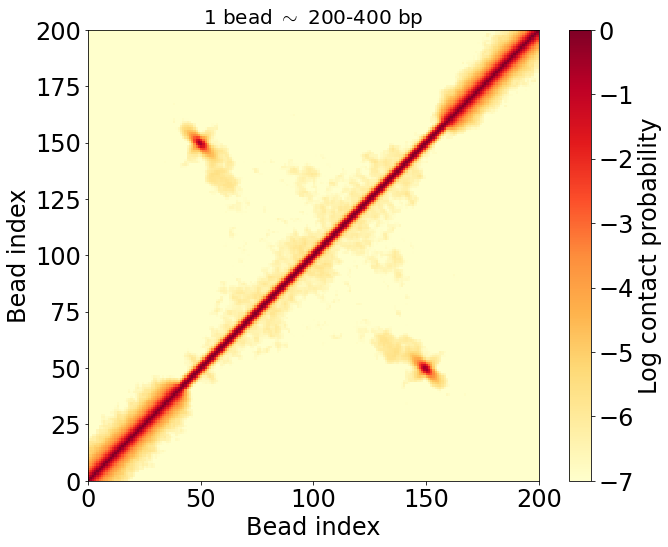

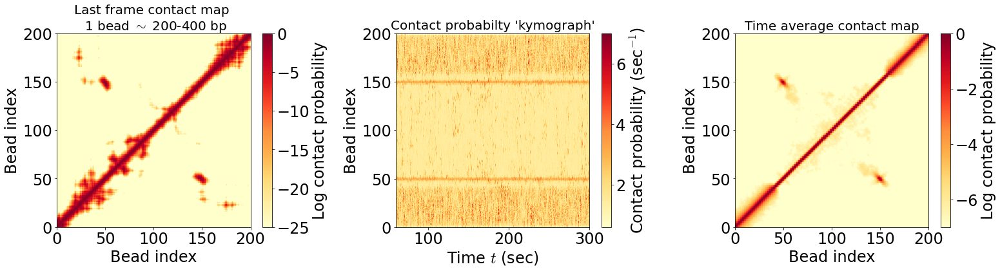

In [287]:
data_path = (ws_path /"21-10-07_aLchr1_looptail700_looprigid_conf")
ss_ind = 600
end_ind = -1
start_bead = 250
end_bead = 450
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)

contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-10-12_aLchr1_line700_stickyloop

3001


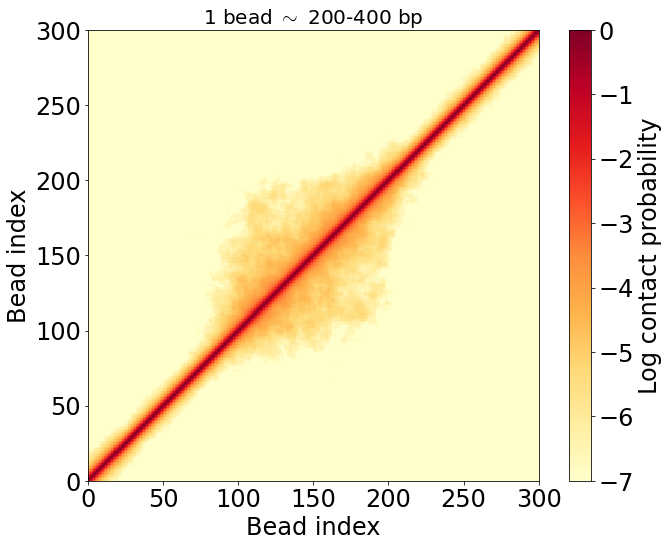

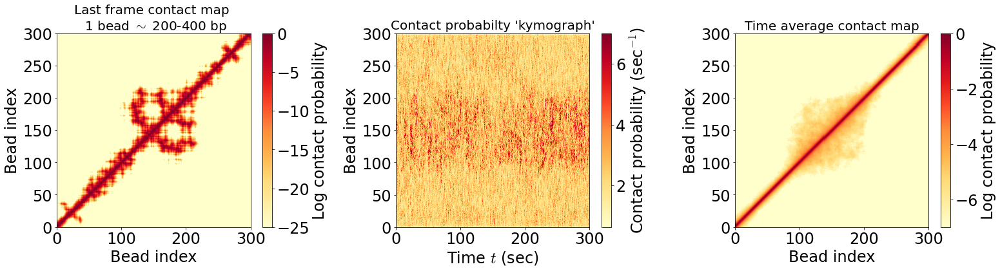

In [303]:
data_path = (ws_path /"21-10-12_aLchr1_line700_stickyloop")
ss_ind = 0
end_ind = -1
start_bead = 200
end_bead = 500
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)

contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-10-12_aLchr1_line700_stickyloop_fixedbase

3001


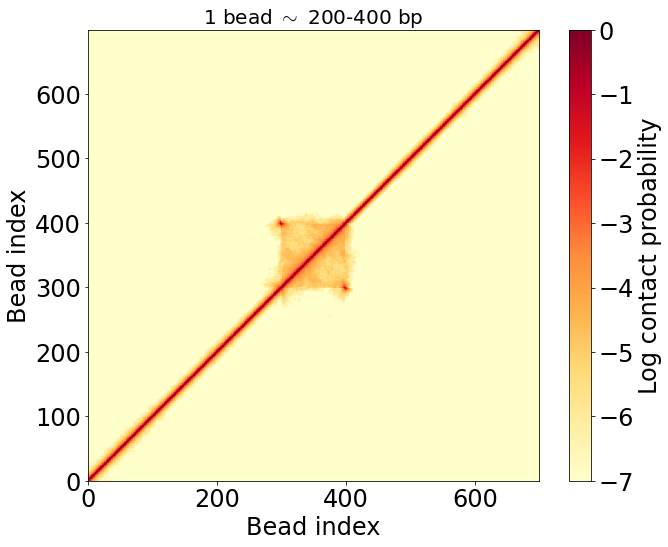

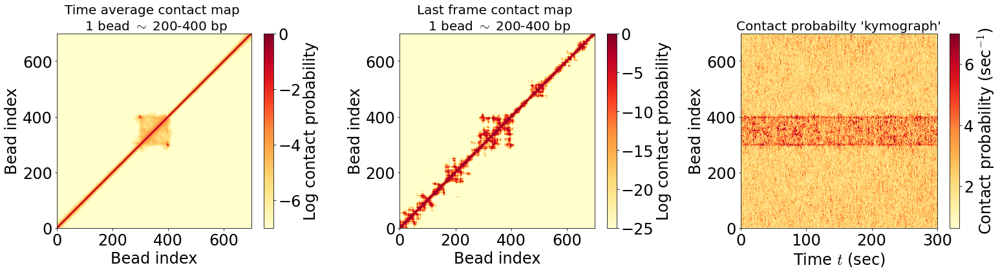

In [241]:
data_path = (ws_path /"21-10-12_aLchr1_line700_stickyloop_fixedbase")
ss_ind = 0
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)

contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-10-18_aLchr1_line700_2xsticky_conf

In [ ]:
data_path = (ws_path /"21-10-18_aLchr1_line700_2xsticky_conf")
ss_ind = 600
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)

contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

4232


## 21-10-18_aLchr1_line700_2xstickyloop

5401


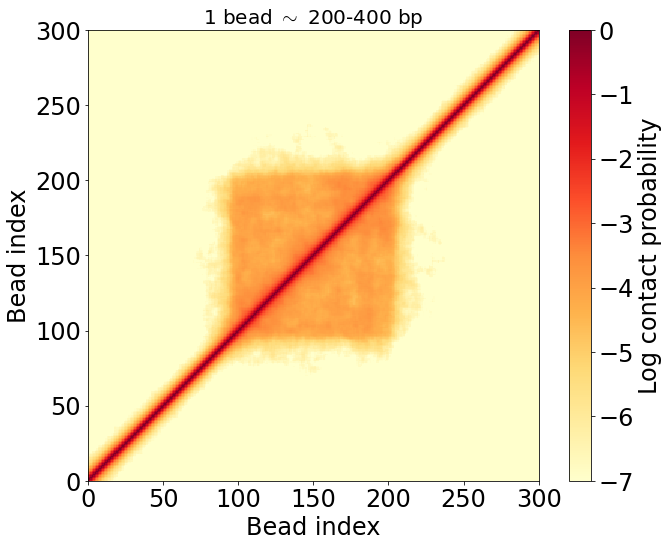

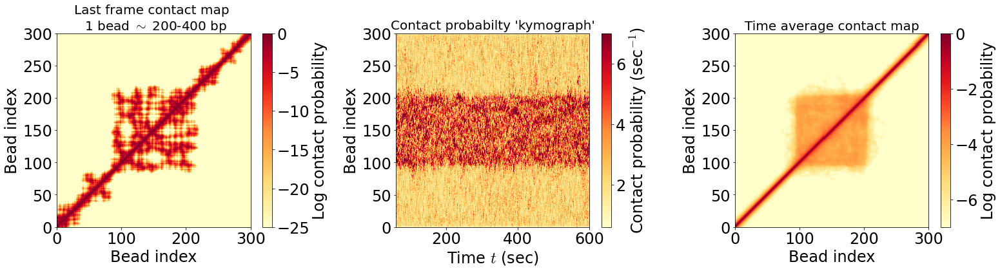

In [315]:
data_path = (ws_path /"21-10-18_aLchr1_line700_2xstickyloop")
ss_ind = 600
end_ind = -1
start_bead = 200
end_bead = 500
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)

contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-10-18_aLchr1_line700_2xstickyloop_conf

2401


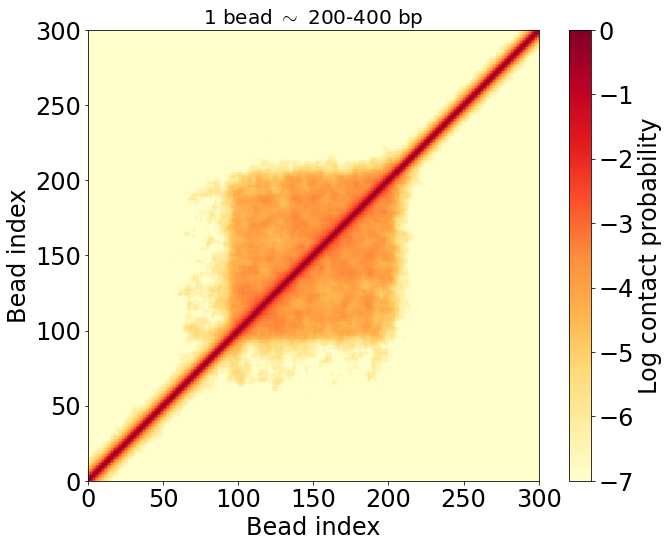

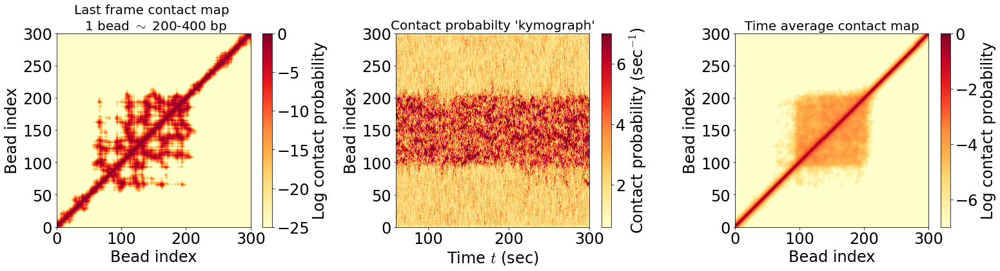

In [316]:
data_path = (ws_path /"21-10-18_aLchr1_line700_2xstickyloop_conf")
ss_ind = 600
end_ind = -1
start_bead = 200
end_bead = 500
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)

contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-10-18_aLchr1_line700_stickyloop_2xKe_conf

2401


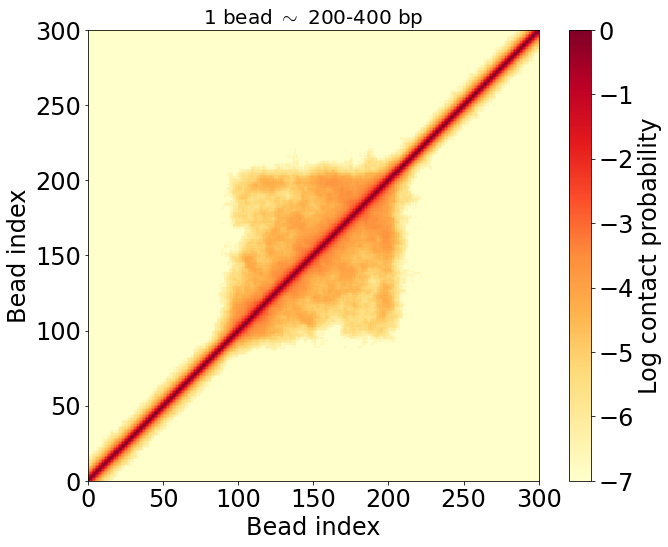

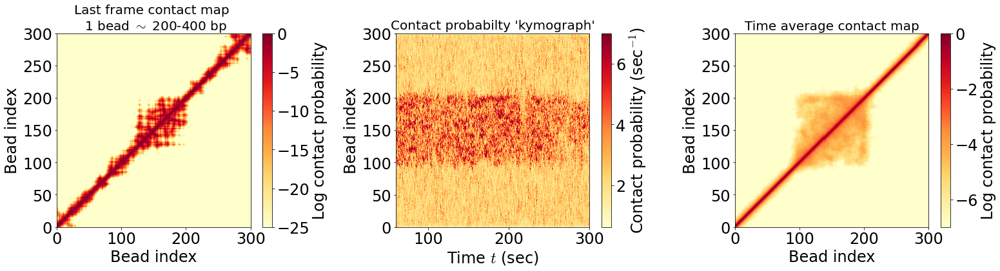

In [284]:
data_path = (ws_path /"21-10-18_aLchr1_line700_stickyloop_2xKe_conf")
ss_ind = 600
end_ind = -1
start_bead = 200
end_bead = 500
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)

contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-10-18_aLchr1_looptail700_stickyloop_rigid_offset

2401


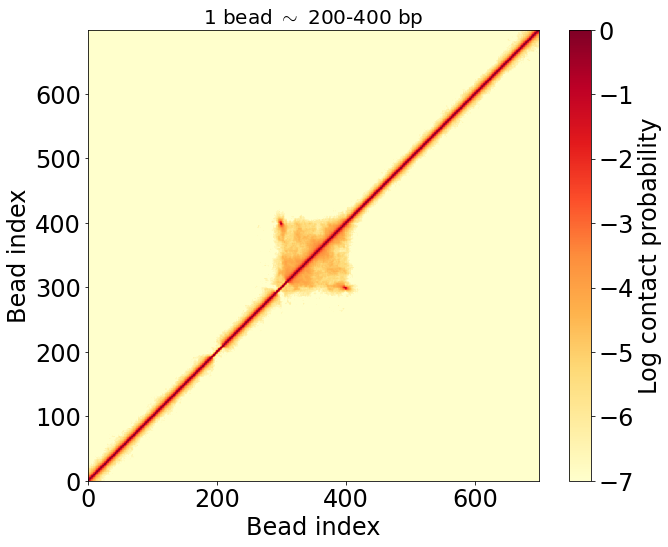

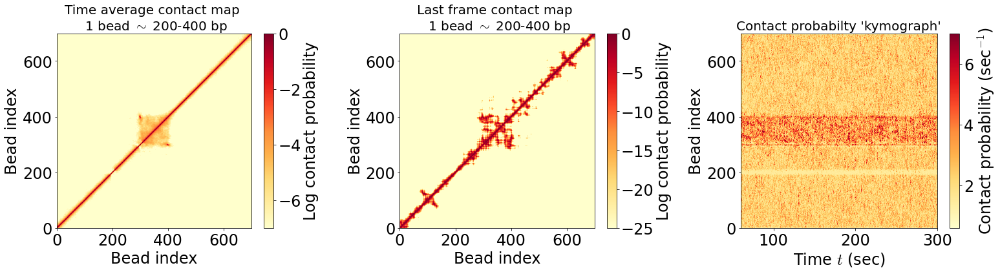

In [246]:
data_path = (ws_path /"21-10-18_aLchr1_looptail700_stickyloop_rigid_offset")
ss_ind = 600
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)

contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-10-18_aLchr1_looptail700_stickyloop_rigid_offset_conf

2401


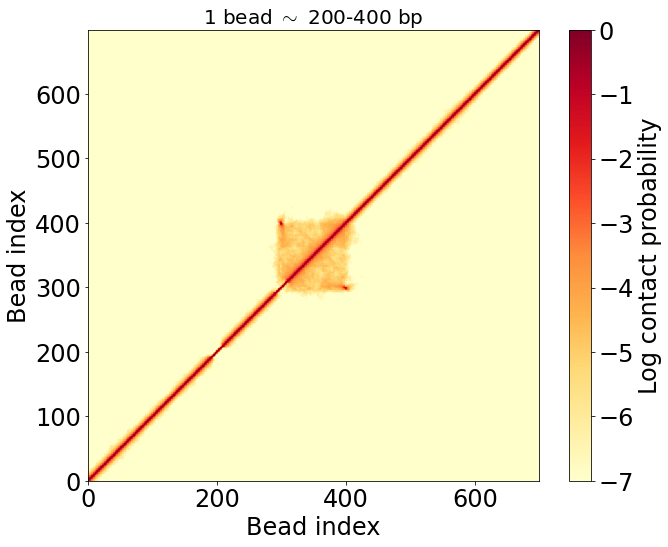

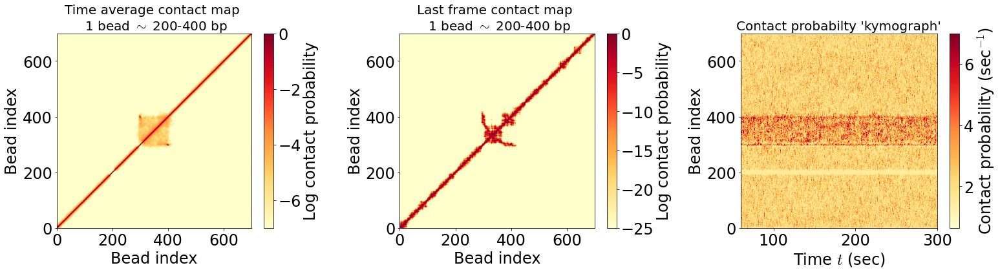

In [247]:
data_path = (ws_path /"21-10-18_aLchr1_looptail700_stickyloop_rigid_offset_conf")
ss_ind = 600
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)

contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-10-18_aLchr1_looptail700_sticky_rigid_offset

2401


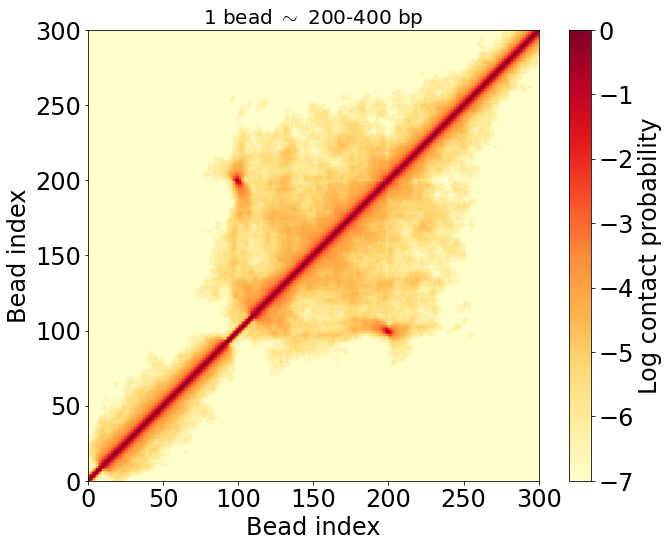

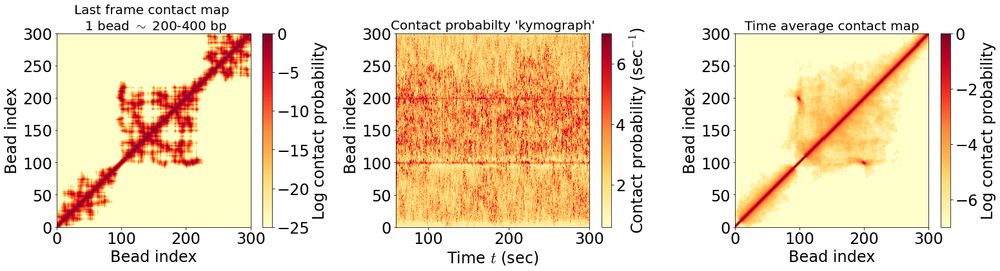

In [295]:
data_path = (ws_path /"21-10-18_aLchr1_looptail700_sticky_rigid_offset")
ss_ind = 600
end_ind = -1
start_bead = 200
end_bead = 500
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)

contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-10-18_aLchr1_looptail700_sticky_rigid_offset_conf

2401


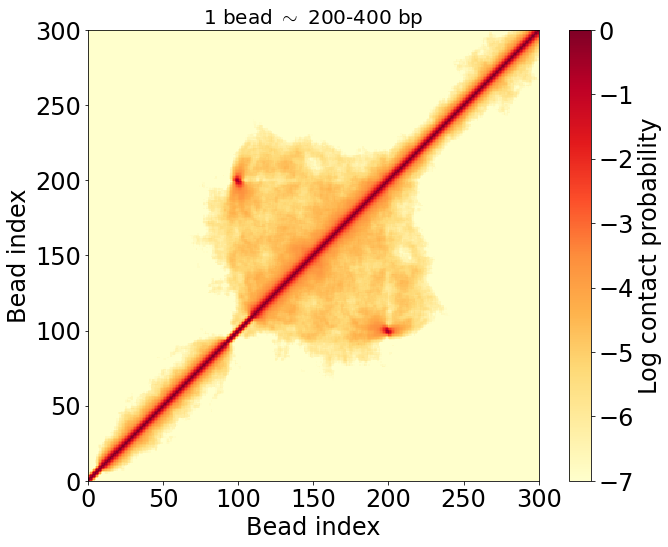

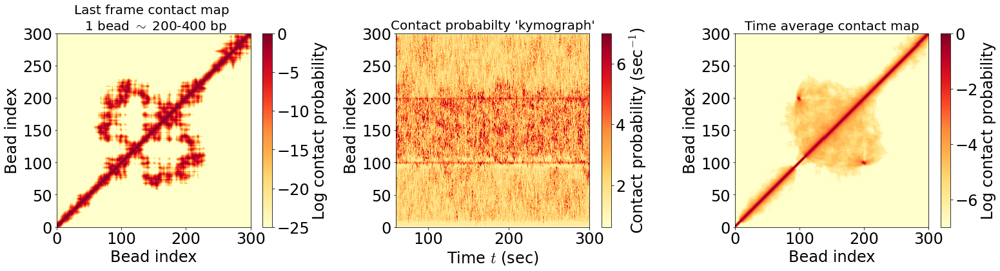

In [298]:
data_path = (ws_path /"21-10-18_aLchr1_looptail700_sticky_rigid_offset_conf")
ss_ind = 600
end_ind = -1
start_bead = 200
end_bead = 500
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)

contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-10-20_aLchr1_looptail700_stickyloop_rigid

2401


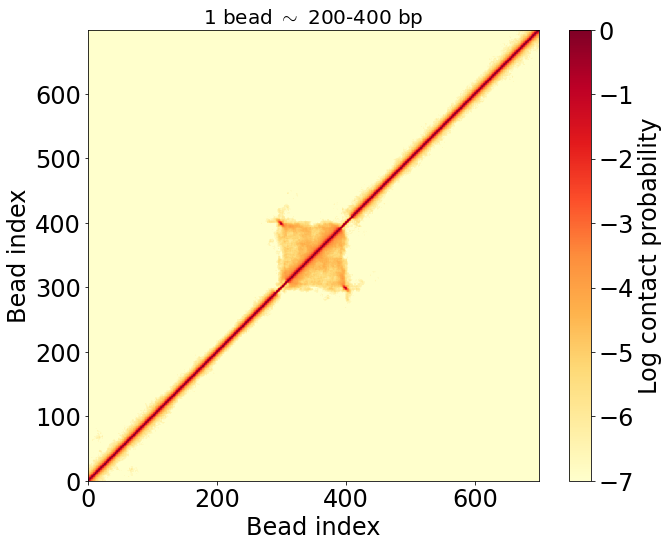

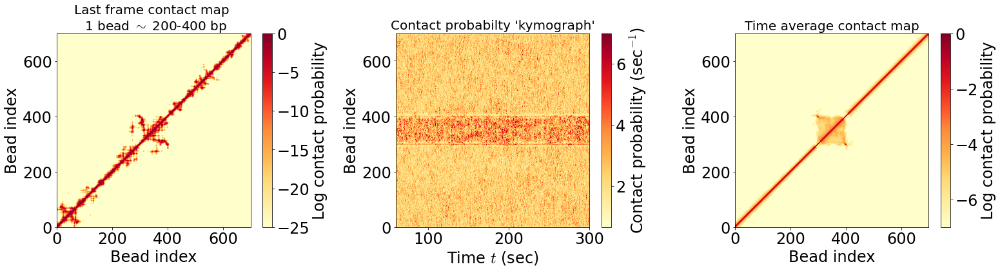

In [256]:
data_path = (ws_path /"21-10-20_aLchr1_looptail700_stickyloop_rigid")
ss_ind = 600
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)

contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-10-20_aLchr1_looptail700_stickyloop_rigid_conf

2401


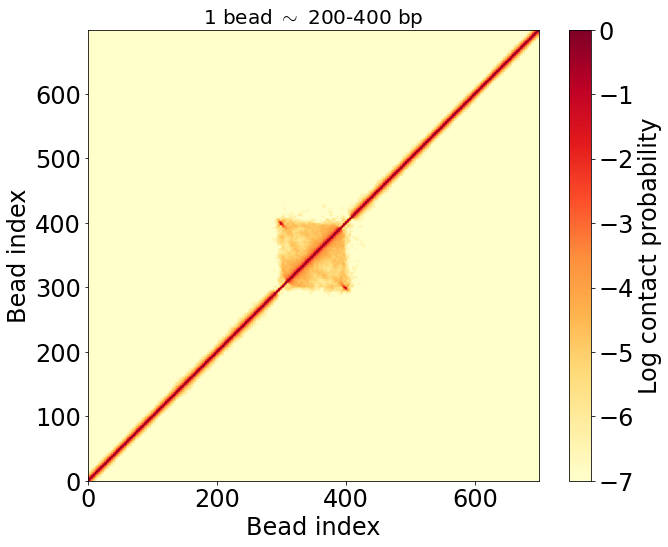

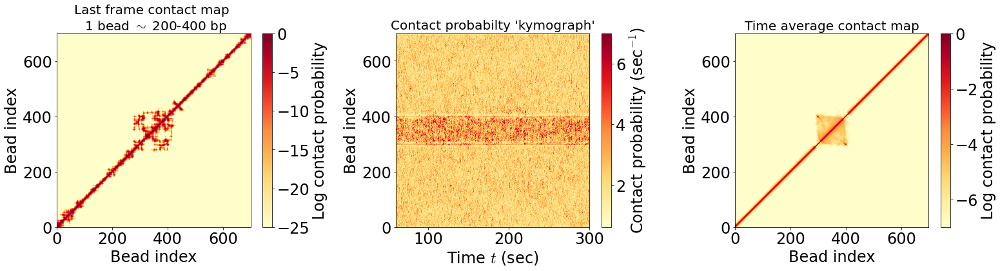

In [257]:
data_path = (ws_path /"21-10-20_aLchr1_looptail700_stickyloop_rigid_conf")
ss_ind = 600
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)

contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-10-20_aLchr1_looptail700_sticky_rigid

2401


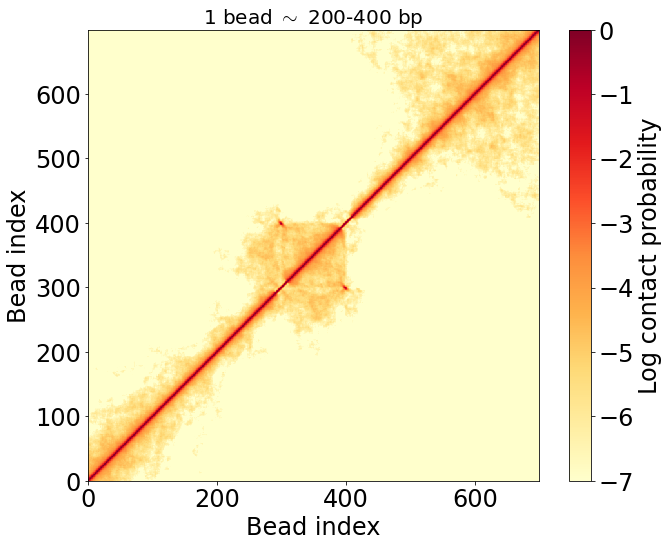

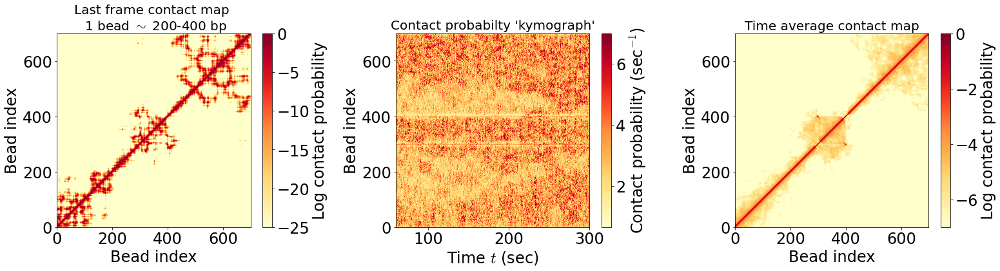

In [258]:
data_path = (ws_path /"21-10-20_aLchr1_looptail700_sticky_rigid")
ss_ind = 600
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)

contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-10-20_aLchr1_looptail700_sticky_rigid_conf

2401


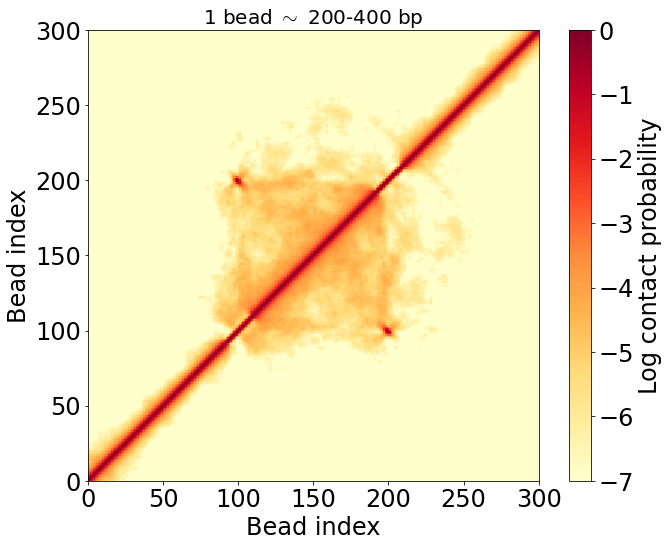

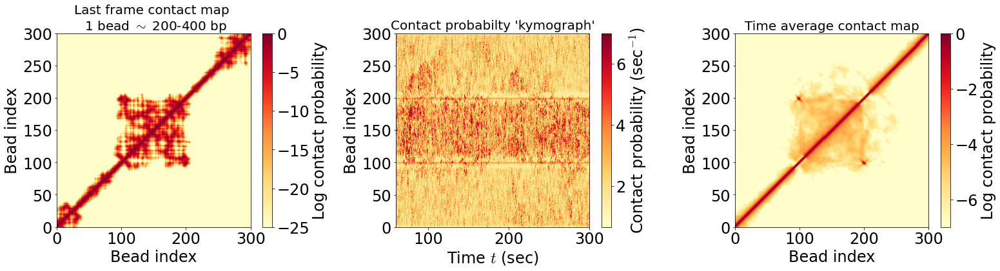

In [285]:
data_path = (ws_path /"21-10-20_aLchr1_looptail700_sticky_rigid_conf")
ss_ind = 600
end_ind = -1
start_bead = 200
end_bead = 500
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)

contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

## 21-10-28_aLchr1_line700_2xsticky_conf_rigid

In [299]:
data_path = (ws_path /"21-10-28_aLchr1_line700_2xsticky_conf_rigid")
ss_ind = 600
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-7)

contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7, avg_contact_map=log_contact_avg_mat)

StopIteration: 

# LEF loops

## 21-08-26_aLchr1_LEF700

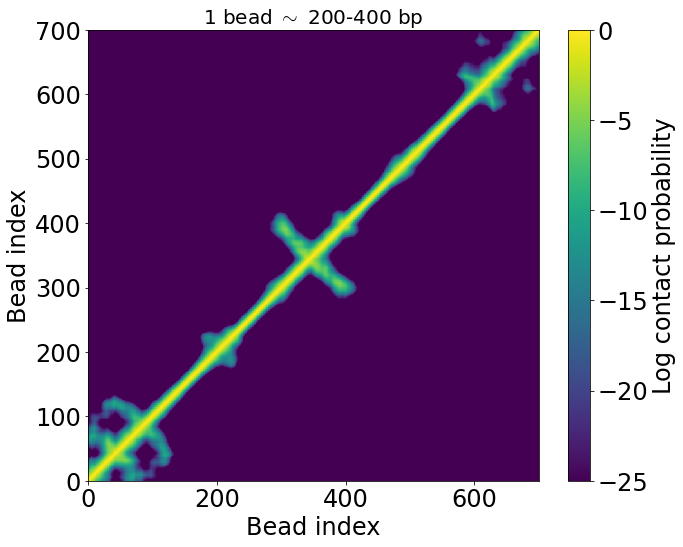

In [281]:
data_path = (ws_path /"21-08-26_aLchr1_LEF700")
ss_ind = 200
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-26_aLchr1_LEF700_conf

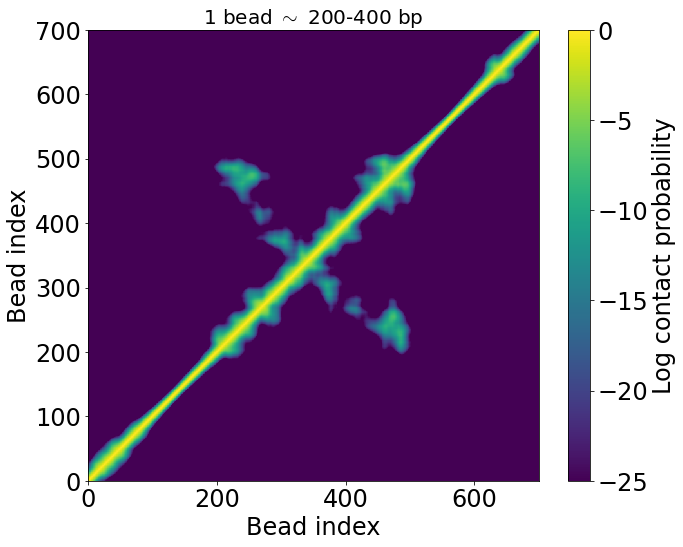

In [275]:
data_path = (ws_path /"21-08-26_aLchr1_LEF700_conf")
ss_ind = -400
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-26_aLchr1_LEF700_one-sided

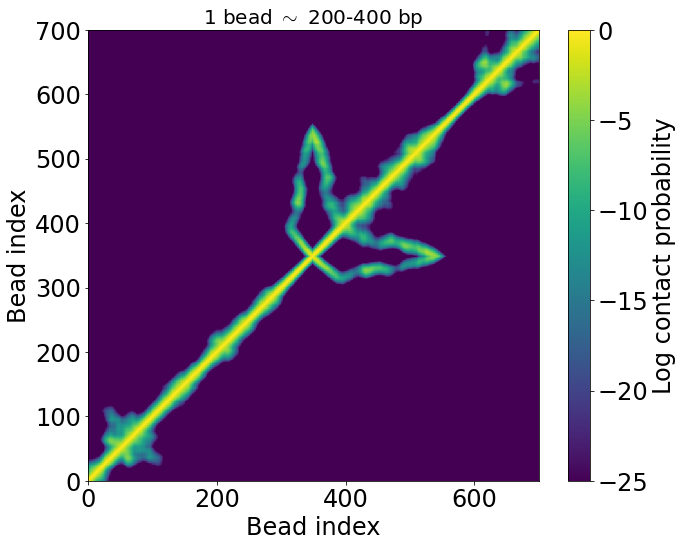

In [273]:
data_path = (ws_path /"21-08-26_aLchr1_LEF700_one-sided")
ss_ind = 800
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

# Conclusions and Next Steps